In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unrar x "/content/drive/MyDrive/Colab Notebooks/cinic-10/train.rar" "/content/sample_data/cinic-10/"
!unrar x "/content/drive/MyDrive/Colab Notebooks/cinic-10/valid.rar" "/content/sample_data/cinic-10/"
!unrar x "/content/drive/MyDrive/Colab Notebooks/cinic-10/test.rar" "/content/sample_data/cinic-10/"

In [ ]:
# Import necessary libraries
import numpy as np
from keras.utils import np_utils
from keras.models import Model, Sequential, load_model
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Reshape, Dropout
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import VGG16
from keras.applications.resnet50 import ResNet50
from sklearn.metrics import confusion_matrix, classification_report
import itertools
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

# Get CINIC-10 Dataset with ImageDataGenerator

In [ ]:
# Directories
train_directory = "/content/sample_data/cinic-10/train"
valid_directory = "/content/sample_data/cinic-10/valid"
test_directory = "/content/sample_data/cinic-10/test"

# Constants
img_rows = 224
img_cols = 224
input_shape = (img_rows,img_cols,3)
epochs = 10
batch_size = 64
num_of_classes = 10
num_of_train_samples = 90000
num_of_valid_samples = 90000
num_of_test_samples = 90000

# Load Train Data as image generator with Keras, Normalization with (rescale=1./255)
train_generator = ImageDataGenerator(rescale=1./255).flow_from_directory(directory=train_directory, 
                                                                         class_mode='categorical', 
                                                                         batch_size=batch_size,
                                                                         target_size=(img_rows, img_cols),
                                                                         color_mode="rgb",
                                                                         shuffle=True)

# Load Validation Data as image generator with Keras, Normalization with (rescale=1./255)
valid_generator = ImageDataGenerator(rescale=1./255).flow_from_directory(directory=valid_directory, 
                                                                         class_mode='categorical', 
                                                                         batch_size=batch_size,
                                                                         target_size=(img_rows, img_cols),
                                                                         color_mode="rgb",
                                                                         shuffle=True)

# Load Test Data as image generator with Keras, Normalization with (rescale=1./255)
test_generator = ImageDataGenerator(rescale=1./255).flow_from_directory(directory=test_directory, 
                                                                        class_mode='categorical', 
                                                                        batch_size=batch_size,
                                                                        target_size=(img_rows, img_cols),
                                                                        color_mode="rgb",
                                                                        shuffle=False)

Found 90000 images belonging to 10 classes.
Found 90000 images belonging to 10 classes.
Found 90000 images belonging to 10 classes.


# CNN Model

In [ ]:
# Create a model for CNN
def getCNNModel(num_of_layers=2, num_of_filters=32, filter_size=(3, 3), initializer='glorot_uniform', activation_function='relu', dropout=0.2, opt='adam'):
  # Create a Sequential
  model = Sequential()

  # Create Convolution layers
  for i in range(0, num_of_layers):
    model.add(Conv2D(num_of_filters, filter_size, kernel_initializer=initializer, activation=activation_function, input_shape=input_shape))
    model.add(MaxPooling2D(2, 2))
    model.add(Dropout(dropout))

  model.add(Flatten())

  model.add(Dense(512, activation=activation_function, kernel_initializer=initializer))
  model.add(Dense(num_of_classes, activation='softmax'))

  # Compile model
  model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
  model.summary()

  return model

In [ ]:
# Function for plotting the Confusion Matrix
def plotConfusionMatrix(cm, class_names, normalize=True, title='Confusion matrix', cmap=plt.cm.Blues):
  plt.figure(figsize=(10,10))
  plt.imshow(cm, interpolation='nearest', cmap=cmap)
  plt.title(title)
  plt.colorbar()

  tick_marks = np.arange(len(class_names))
  plt.xticks(tick_marks, class_names, rotation=45)
  plt.yticks(tick_marks, class_names)

  if normalize:
      cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
      cm = np.around(cm, decimals=2)
      cm[np.isnan(cm)] = 0.0
      print("Normalized confusion matrix")

  else:
      print('Confusion matrix, without normalization')

  thresh = cm.max() / 2.
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      plt.text(j, i, cm[i, j],
                horizontalalignment="center",
                color="white" if cm[i, j] > thresh else "black")

  plt.tight_layout()
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.show()

In [ ]:
# Function for train the given model and get Confusion Matrix
def trainModelAndGetConfusionMatrix(model):
  # Fit the model
  model.fit_generator(train_generator,
                      epochs=epochs,
                      steps_per_epoch=num_of_train_samples // batch_size,
                      validation_data=valid_generator,
                      validation_steps=num_of_valid_samples // batch_size)

  # Evaluate the model
  loss_and_metrics = model.evaluate_generator(test_generator, steps=num_of_test_samples // batch_size+1)
  print("Test Loss: ", loss_and_metrics[0])
  print("Test Accuracy: ", loss_and_metrics[1])
  test_generator.reset()

  # Get Confusion Matrix and plot it
  Y_pred = model.predict_generator(test_generator, steps=num_of_test_samples // batch_size+1)
  y_pred = np.argmax(Y_pred, axis=1)

  class_names = []
  for key in train_generator.class_indices:
      class_names.append(key)

  cr = classification_report(test_generator.classes, y_pred, target_names=class_names)
  print("Classification Report\n" + cr) # Print classification report
  cm = confusion_matrix(test_generator.classes, y_pred)

  plotConfusionMatrix(cm, class_names, normalize=False, title='Confusion Matrix')
  plotConfusionMatrix(cm, class_names, normalize=True, title='Confusion Matrix')

  return model

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 111, 111, 32)      0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 109, 109, 32)      9248      
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 54, 54, 32)        0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 54, 54, 32)        0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 93312)            

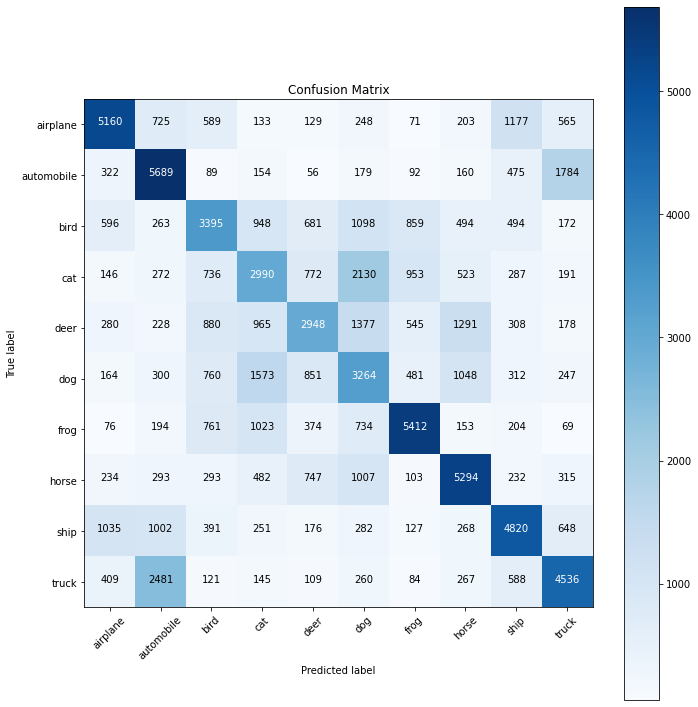

Normalized confusion matrix


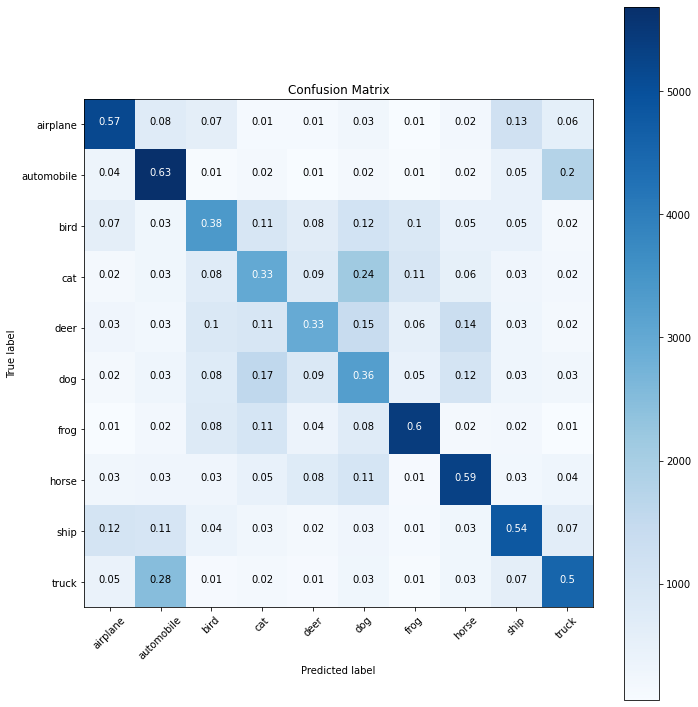

In [ ]:
# Combination 1
model = getCNNModel(num_of_layers=2, num_of_filters=32, filter_size=(3, 3), initializer='glorot_normal', activation_function='relu', dropout=0.2, opt='adam')
model = trainModelAndGetConfusionMatrix(model)
model.save('/content/drive/MyDrive/Colab Notebooks/cinic-10/model_comb1.h5')

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 220, 220, 32)      2432      
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 110, 110, 32)      0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 110, 110, 32)      0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 106, 106, 32)      25632     
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 53, 53, 32)        0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 53, 53, 32)        0         
_________________________________________________________________
flatten_6 (Flatten)          (None, 89888)            

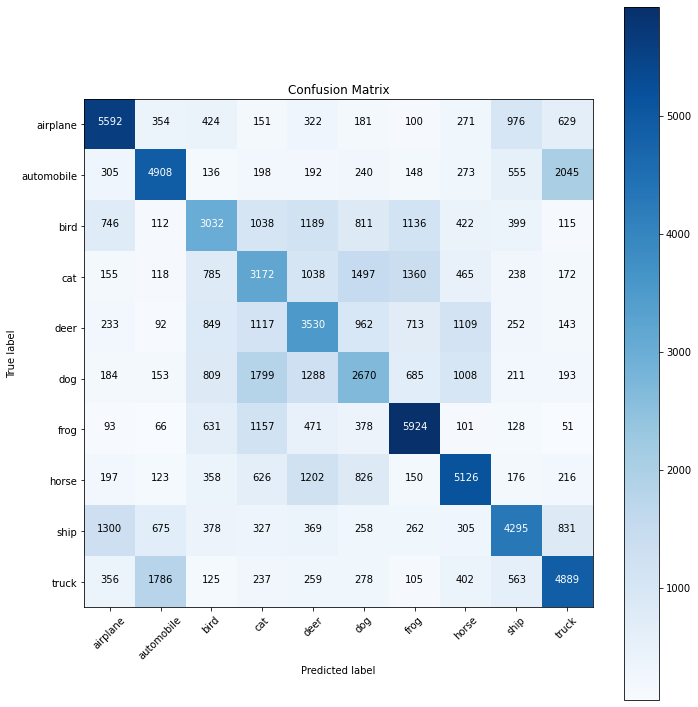

Normalized confusion matrix


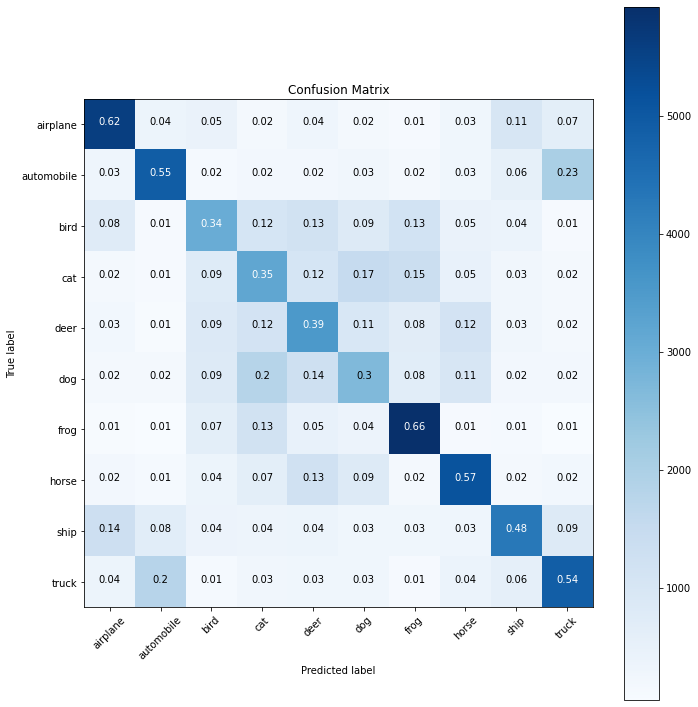

In [ ]:
# Combination 2
model = getCNNModel(num_of_layers=2, num_of_filters=32, filter_size=(5, 5), initializer='glorot_normal', activation_function='relu', dropout=0.2, opt='adam')
model = trainModelAndGetConfusionMatrix(model)
model.save('/content/drive/MyDrive/Colab Notebooks/cinic-10/model_comb2.h5')

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 111, 111, 32)      0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 109, 109, 32)      9248      
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 54, 54, 32)        0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 54, 54, 32)        0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 93312)            

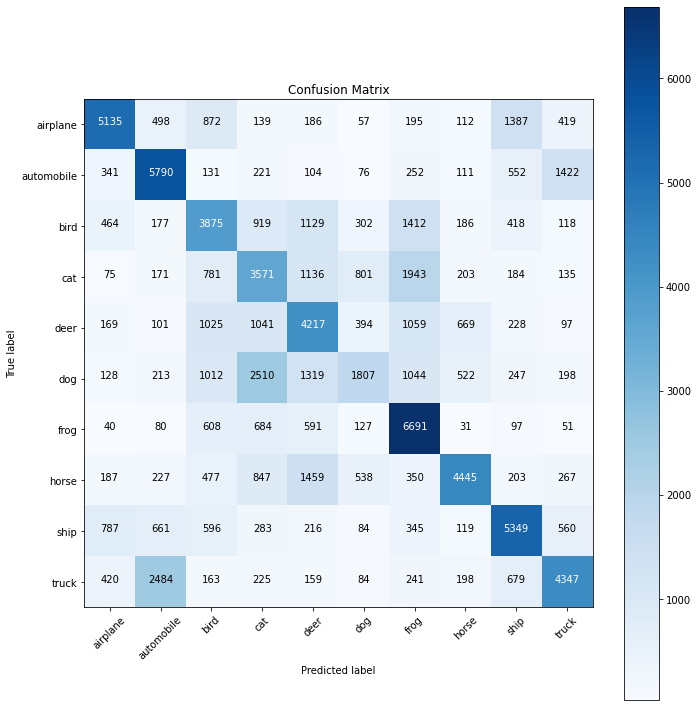

Normalized confusion matrix


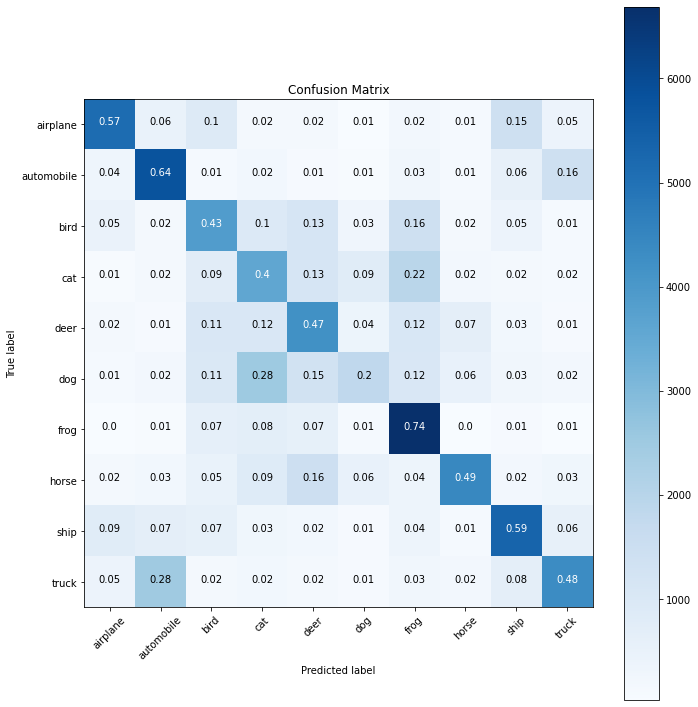

In [ ]:
# Combination 3
model = getCNNModel(num_of_layers=2, num_of_filters=32, filter_size=(3, 3), initializer='glorot_normal', activation_function='relu', dropout=0.7, opt='adam')
model = trainModelAndGetConfusionMatrix(model)
model.save('/content/drive/MyDrive/Colab Notebooks/cinic-10/model_comb3.h5')

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_14 (Conv2D)           (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 111, 111, 32)      0         
_________________________________________________________________
dropout_14 (Dropout)         (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 109, 109, 32)      9248      
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 54, 54, 32)        0         
_________________________________________________________________
dropout_15 (Dropout)         (None, 54, 54, 32)        0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 52, 52, 32)       

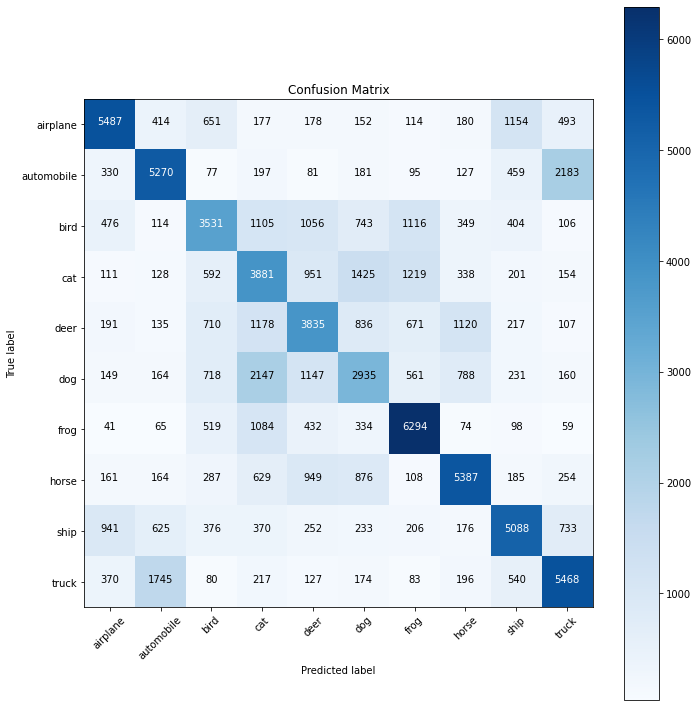

Normalized confusion matrix


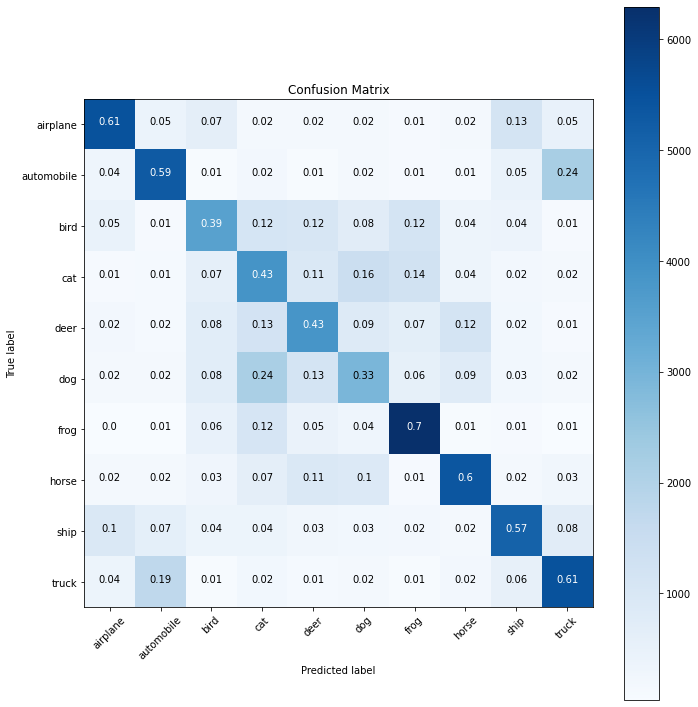

In [ ]:
# Combination 4
model = getCNNModel(num_of_layers=3, num_of_filters=32, filter_size=(3, 3), initializer='glorot_uniform', activation_function='relu', dropout=0.2, opt='adam')
model = trainModelAndGetConfusionMatrix(model)
model.save('/content/drive/MyDrive/Colab Notebooks/cinic-10/model_comb4.h5')

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_20 (Conv2D)           (None, 220, 220, 32)      2432      
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 110, 110, 32)      0         
_________________________________________________________________
dropout_20 (Dropout)         (None, 110, 110, 32)      0         
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 106, 106, 32)      25632     
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 53, 53, 32)        0         
_________________________________________________________________
dropout_21 (Dropout)         (None, 53, 53, 32)        0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 49, 49, 32)       

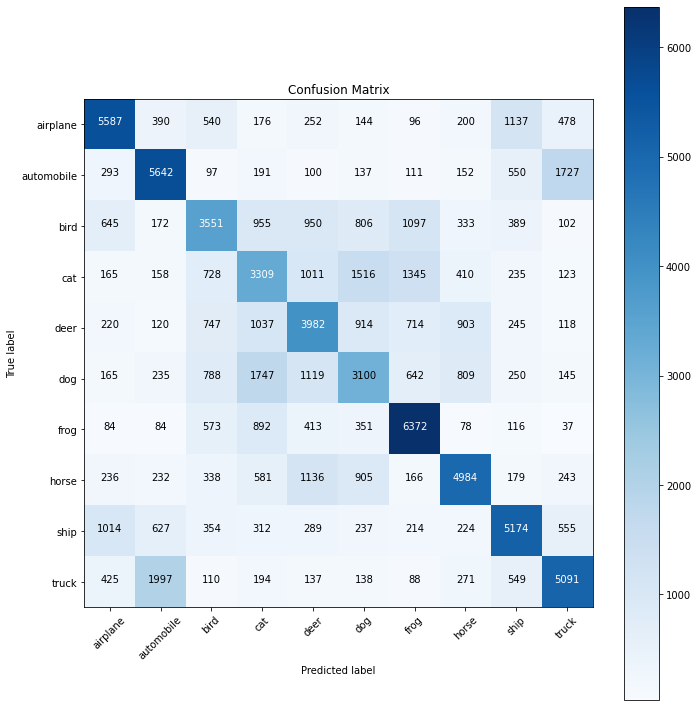

Normalized confusion matrix


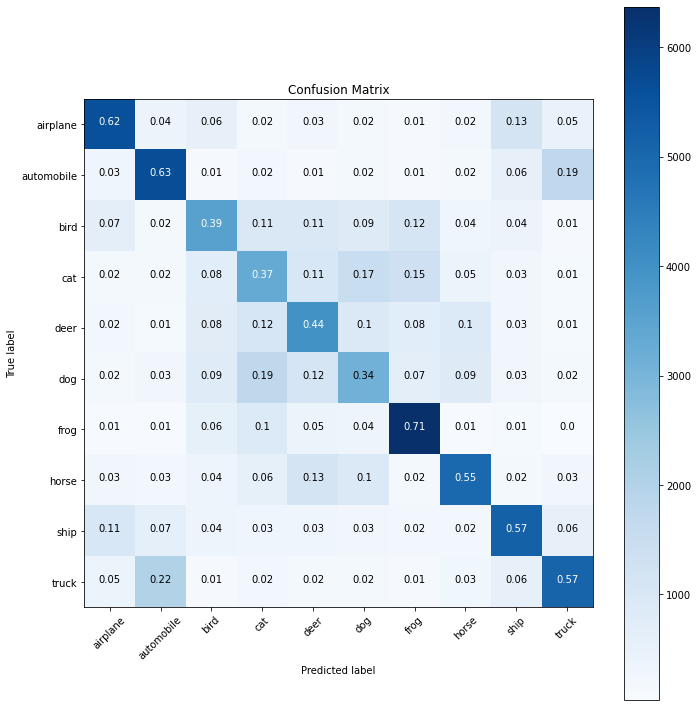

In [ ]:
# Combination 5
model = getCNNModel(num_of_layers=3, num_of_filters=32, filter_size=(5, 5), initializer='glorot_uniform', activation_function='relu', dropout=0.2, opt='adam')
model = trainModelAndGetConfusionMatrix(model)
model.save('/content/drive/MyDrive/Colab Notebooks/cinic-10/model_comb5.h5')

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_23 (Conv2D)           (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d_23 (MaxPooling (None, 111, 111, 32)      0         
_________________________________________________________________
dropout_23 (Dropout)         (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 109, 109, 32)      9248      
_________________________________________________________________
max_pooling2d_24 (MaxPooling (None, 54, 54, 32)        0         
_________________________________________________________________
dropout_24 (Dropout)         (None, 54, 54, 32)        0         
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 52, 52, 32)      

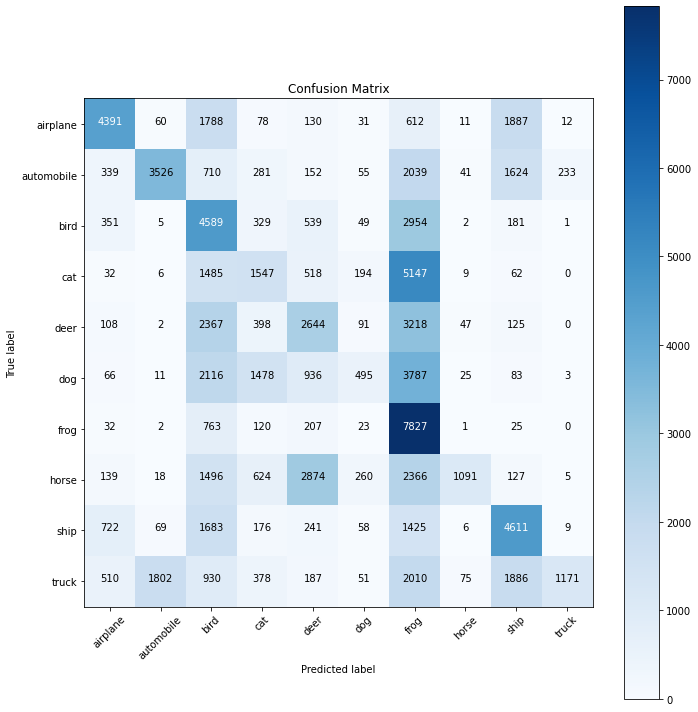

Normalized confusion matrix


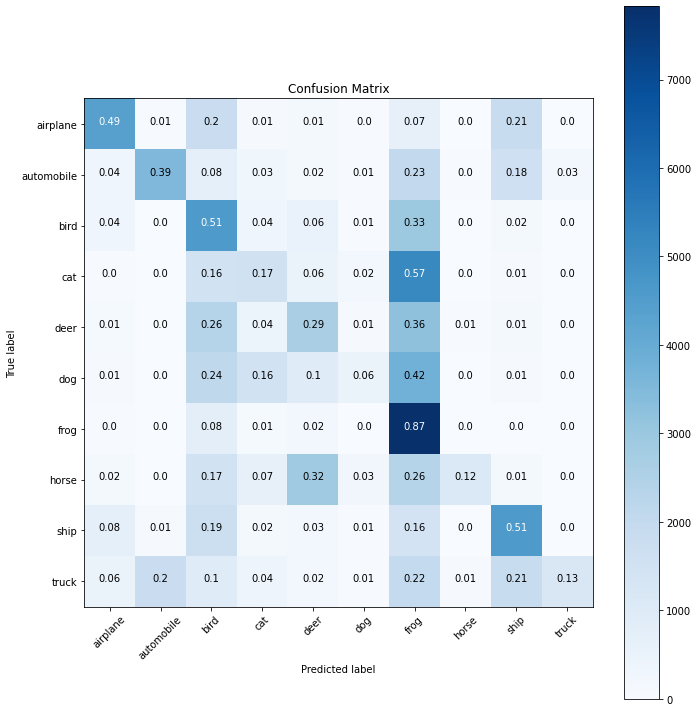

In [ ]:
# Combination 6
model = getCNNModel(num_of_layers=3, num_of_filters=32, filter_size=(3, 3), initializer='glorot_uniform', activation_function='relu', dropout=0.7, opt='adam')
model = trainModelAndGetConfusionMatrix(model)
model.save('/content/drive/MyDrive/Colab Notebooks/cinic-10/model_comb6.h5')

# Comparison of Combinations of CNN Models

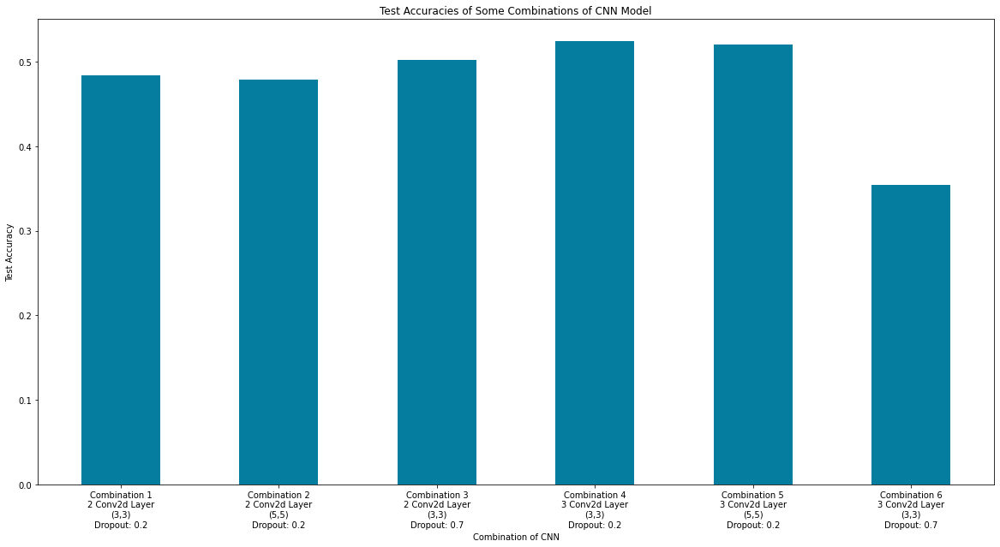

In [ ]:
# Plot a graphic which we can see test accuracies of CNN Combinations above
data = {'Combination 1\n2 Conv2d Layer\n(3,3)\nDropout: 0.2':0.4834,
        'Combination 2\n2 Conv2d Layer\n(5,5)\nDropout: 0.2':0.4793,
        'Combination 3\n2 Conv2d Layer\n(3,3)\nDropout: 0.7':0.5025,  
        'Combination 4\n3 Conv2d Layer\n(3,3)\nDropout: 0.2':0.5241,
        'Combination 5\n3 Conv2d Layer\n(5,5)\nDropout: 0.2':0.5199,
        'Combination 6\n3 Conv2d Layer\n(3,3)\nDropout: 0.7':0.3543} 
combinations = list(data.keys()) 
accuracies = list(data.values()) 
   
fig = plt.figure(figsize = (20, 10)) 
  
# creating the bar plot 
plt.bar(combinations, accuracies, color='#057D9F', width=0.5) 

plt.xlabel("Combination of CNN") 
plt.ylabel("Test Accuracy") 
plt.title("Test Accuracies of Some Combinations of CNN Model") 
plt.show() 

# VGG-16 Model

In [ ]:
# Get VGG-16 Model
def getVGG16Model(lastFourTrainable=False):
  vgg_model = VGG16(weights='imagenet', input_shape=input_shape, include_top=True)

  # Make all layers untrainable
  for layer in vgg_model.layers[:]:
      layer.trainable = False

  # Add fully connected layer which have 1024 neuron to VGG-16 model
  output = vgg_model.get_layer('fc2').output
  output = Flatten(name='new_flatten')(output)
  output = Dense(units=1024, activation='relu', name='new_fc')(output)
  output = Dense(units=10, activation='softmax')(output)
  vgg_model = Model(vgg_model.input, output)

  # Make last 4 layers trainable if lastFourTrainable == True
  if lastFourTrainable == True:
    vgg_model.get_layer('block5_conv3').trainable = True
    vgg_model.get_layer('fc1').trainable = True
    vgg_model.get_layer('fc2').trainable = True
    vgg_model.get_layer('new_fc').trainable = True

  # Compile VGG-16 model
  vgg_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
  vgg_model.summary()

  return vgg_model

553467904/553467096 [==============================] - 3s 0us/step
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
____________________________________________________________

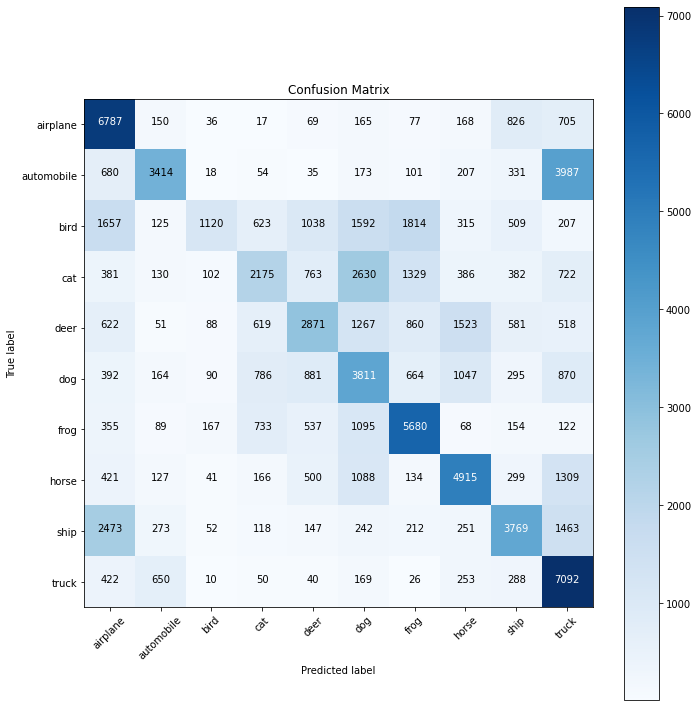

Normalized confusion matrix


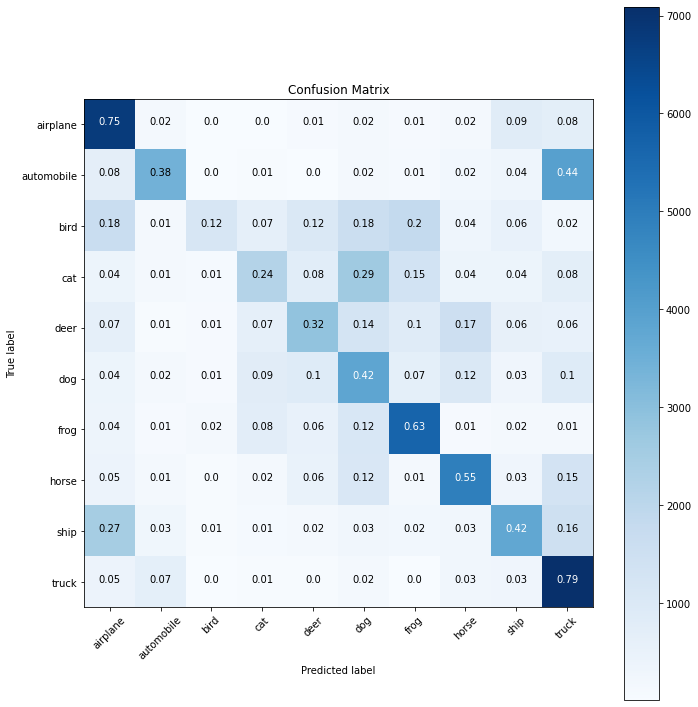

In [ ]:
# Get VGG-16 Model with lastFourTrainable=False
vgg_model_a = getVGG16Model(lastFourTrainable=False)
# Train VGG-16 Model and get Confusion Matrix
vgg_model_a = trainModelAndGetConfusionMatrix(vgg_model_a)
vgg_model_a.save_weights('/content/drive/MyDrive/Colab Notebooks/cinic-10/model_vgg_nontrainable.h5')

553467904/553467096 [==============================] - 4s 0us/step
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
____________________________________________________________

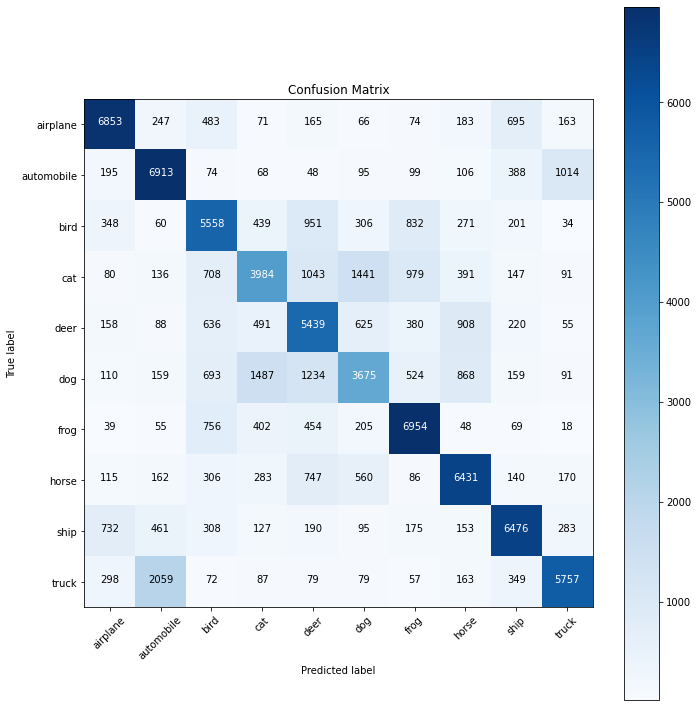

Normalized confusion matrix


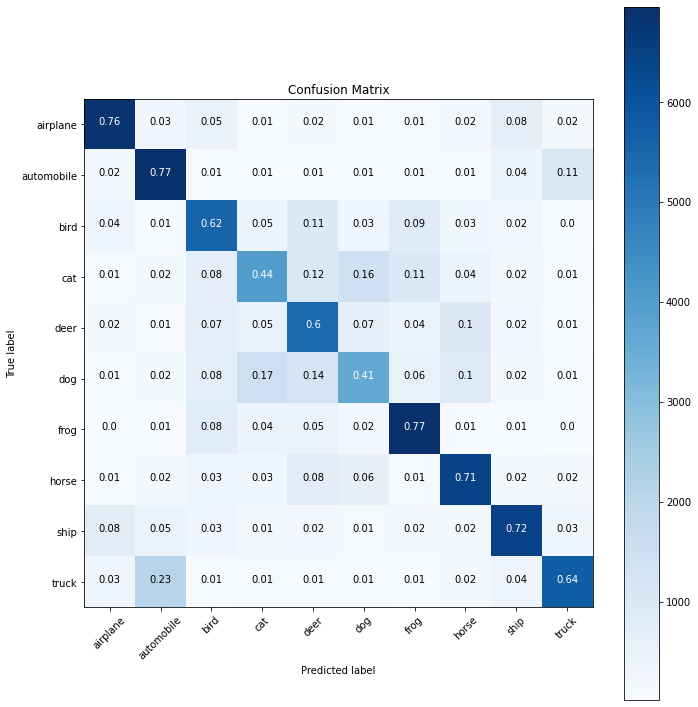

In [ ]:
# Get VGG-16 Model with lastFourTrainable=True
vgg_model_b = getVGG16Model(lastFourTrainable=True)
# Train VGG-16 Model and get Confusion Matrix
vgg_model_b = trainModelAndGetConfusionMatrix(vgg_model_b)
vgg_model_b.save_weights('/content/drive/MyDrive/Colab Notebooks/cinic-10/model_vgg_trainable.h5')

# ResNet-50 Model

In [ ]:
# Get ResNet-50 Model
def getResNet50Model(lastFourTrainable=False):
  resnet_model = ResNet50(weights='imagenet', input_shape=input_shape, include_top=True)

  # Make all layers non-trainable
  for layer in resnet_model.layers[:]:
      layer.trainable = False

  # Add fully connected layer which have 1024 neuron to ResNet-50 model
  output = resnet_model.get_layer('avg_pool').output
  output = Flatten(name='new_flatten')(output)
  output = Dense(units=1024, activation='relu', name='new_fc')(output)
  output = Dense(units=10, activation='softmax')(output)
  resnet_model = Model(resnet_model.input, output)

  # Make last 4 layers trainable if lastFourTrainable == True
  if lastFourTrainable == True:
    resnet_model.get_layer('conv5_block3_2_bn').trainable = True
    resnet_model.get_layer('conv5_block3_3_conv').trainable = True
    resnet_model.get_layer('conv5_block3_3_bn').trainable = True
    resnet_model.get_layer('new_fc').trainable = True

  # Compile ResNet-50 model
  resnet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
  resnet_model.summary()
  
  return resnet_model

102973440/102967424 [==============================] - 1s 0us/step
Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
_________________________

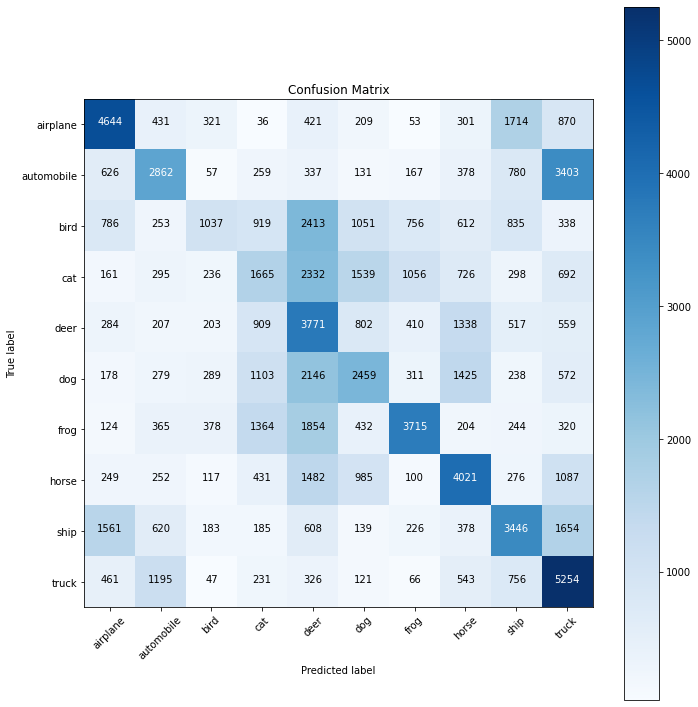

Normalized confusion matrix


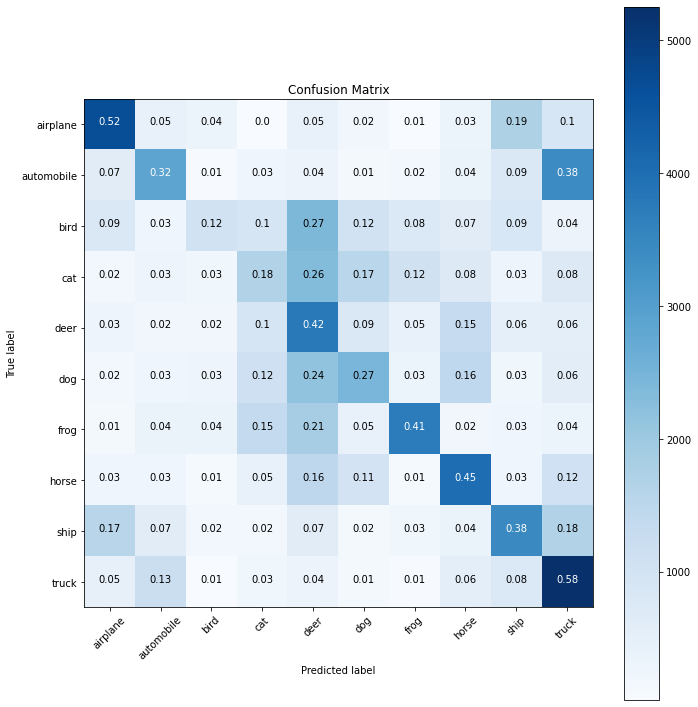

In [ ]:
# Get ResNet-50 Model with lastFourTrainable=False
resnet_model_a = getResNet50Model(lastFourTrainable=False)
# Train ResNet-50 Model and get Confusion Matrix
resnet_model_a = trainModelAndGetConfusionMatrix(resnet_model_a)
resnet_model_a.save_weights('/content/drive/MyDrive/Colab Notebooks/cinic-10/model_resnet_nontrainable.h5')

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_4[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
____________________________________________________________________________________________

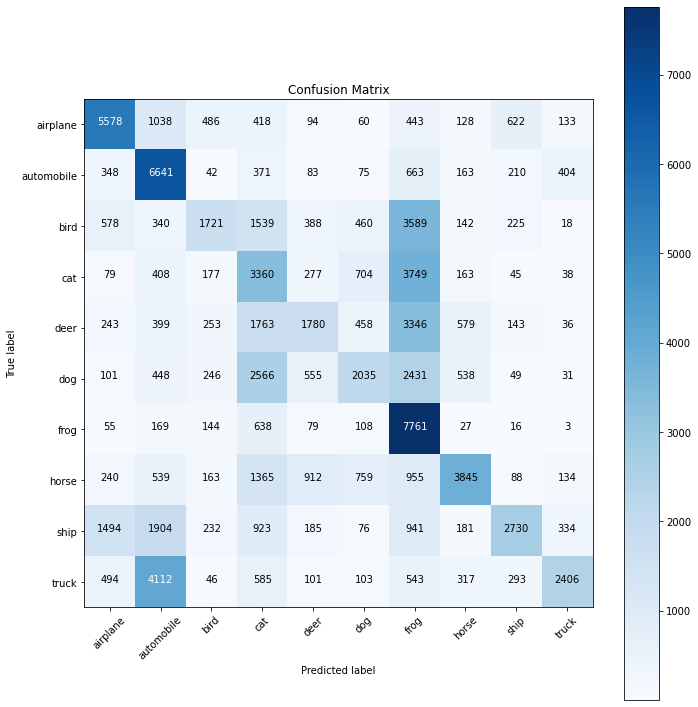

Normalized confusion matrix


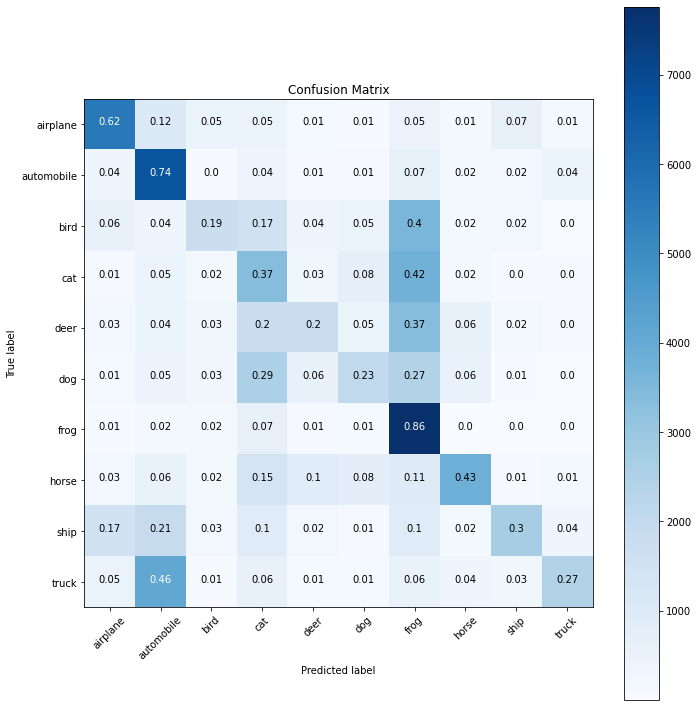

In [ ]:
# Get ResNet-50 Model with lastFourTrainable=True
resnet_model_b = getResNet50Model(lastFourTrainable=True)
# Train ResNet-50 Model and get Confusion Matrix
resnet_model_b = trainModelAndGetConfusionMatrix(resnet_model_b)
resnet_model_b.save_weights('/content/drive/MyDrive/Colab Notebooks/cinic-10/model_resnet_trainable.h5')

# Comparison of Transfer Learning Models

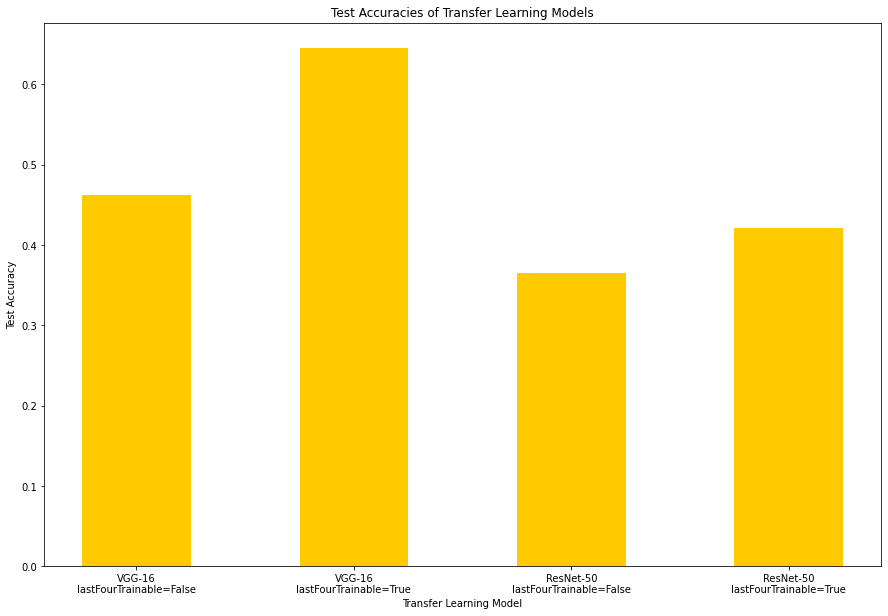

In [ ]:
# Plot a graphic which we can see test accuracies of Transfer Learning models
data = {'VGG-16\nlastFourTrainable=False':0.4625,
        'VGG-16\nlastFourTrainable=True':0.6448,
        'ResNet-50\nlastFourTrainable=False':0.3652,  
        'ResNet-50\nlastFourTrainable=True':0.4206} 
combinations = list(data.keys()) 
accuracies = list(data.values()) 
   
fig = plt.figure(figsize = (15, 10)) 
  
# creating the bar plot 
plt.bar(combinations, accuracies, color='#FFCA00', width=0.5) 

plt.xlabel("Transfer Learning Model") 
plt.ylabel("Test Accuracy") 
plt.title("Test Accuracies of Transfer Learning Models") 
plt.show() 

# Feature Extraction for Image Retrieval with Weights of Transfer Learning Models

In [ ]:
# Get feature vector of an image by given model and img_path
def getFeatureVector(model, img_path):
  img = cv2.imread(img_path)
  img = cv2.resize(img, (224, 224))
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  feature_vector = model.predict(img.reshape(1, 224, 224, 3))

  print(img_path + " is added.")
  return feature_vector

# Get cosine similarity between feature vectors A and B using cosine similarity
def getCosineSimilarity(A, B):
  cos_similarity = np.dot(A,B.T) / (np.linalg.norm(A)*np.linalg.norm(B)) # Get cosine similarity
  return cos_similarity[0][0]

In [ ]:
# Function for get dataframe which contains the output features of given model
def getFeatureDataFrame(model):
  df = pd.DataFrame(columns=['file', 'features'])
  train_files = train_generator.filepaths
  valid_files = valid_generator.filepaths

  files = train_files + valid_files
  print(len(files))

  df['file'] = files
  df['features'] = df.apply(lambda row: getFeatureVector(model, row['file']), axis=1) 

  print("All files added.")
  return df

In [ ]:
# Get feature extractor model from last layer of vgg_model_a
vgg_model_a = getVGG16Model(lastFourTrainable=False)
vgg_model_a.load_weights('/content/drive/MyDrive/Colab Notebooks/cinic-10/model_vgg_nontrainable.h5')
feature_model_vgg_a = Model(inputs=vgg_model_a.input, outputs=vgg_model_a.get_layer('new_fc').output)

df = getFeatureDataFrame(feature_model_vgg_a)
df.to_pickle("/content/drive/MyDrive/Colab Notebooks/cinic-10/features_vgg_a.pickle")

In [ ]:
# Get feature extractor model from last layer of vgg_model_b
vgg_model_b = getVGG16Model(lastFourTrainable=True)
vgg_model_b.load_weights('/content/drive/MyDrive/Colab Notebooks/cinic-10/model_vgg_trainable.h5')
feature_model_vgg_b = Model(inputs=vgg_model_b.input, outputs=vgg_model_b.get_layer('new_fc').output)

df = getFeatureDataFrame(feature_model_vgg_b)
df.to_pickle("/content/drive/MyDrive/Colab Notebooks/cinic-10/features_vgg_b.pickle")

In [ ]:
# Get feature extractor model from last layer of resnet_model_a
resnet_model_a = getResNet50Model(lastFourTrainable=False)
resnet_model_a.load_weights('/content/drive/MyDrive/Colab Notebooks/cinic-10/model_resnet_nontrainable.h5')
feature_model_resnet_a = Model(inputs=resnet_model_a.input, outputs=resnet_model_a.get_layer('new_fc').output)

df = getFeatureDataFrame(feature_model_resnet_a)
df.to_pickle("/content/drive/MyDrive/Colab Notebooks/cinic-10/features_resnet_a.pickle")

In [ ]:
# Get feature extractor model from last layer of resnet_model_b
resnet_model_b = getResNet50Model(lastFourTrainable=True)
resnet_model_b.load_weights('/content/drive/MyDrive/Colab Notebooks/cinic-10/model_resnet_trainable.h5')
feature_model_resnet_b = Model(inputs=resnet_model_b.input, outputs=resnet_model_b.get_layer('new_fc').output)

df = getFeatureDataFrame(feature_model_resnet_b)
df.to_pickle("/content/drive/MyDrive/Colab Notebooks/cinic-10/features_resnet_b.pickle")

In [ ]:
# Plot similar 5 images with given image and similar images dataframe
def plotSimilarImages(img_file, similar_df, model_name):
  img = cv2.imread(img_file)
  img = cv2.resize(img, (224, 224))
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  split_list = img_file.split('/')
  split_list.reverse()
  img_class = split_list[1]
  fig, axarr = plt.subplots(2,3)
  axarr[0,0].imshow(img)
  axarr[0,0].set_title("TEST IMAGE - " + model_name + "\nClass: " + img_class)
  axarr[0,0].axis('off')

  j, k, m = 0, 0, 1
  for index, sim in similar_df.iterrows():
    filepath = sim['file']
    similarity = sim['similarity']
    split_list = filepath.split('/')
    split_list.reverse()
    sim_class = split_list[1]

    similar = cv2.imread(filepath)
    similar = cv2.resize(similar, (224, 224))
    similar = cv2.cvtColor(similar, cv2.COLOR_BGR2RGB)
    axarr[k,m].imshow(similar)
    axarr[k,m].set_title("Similarity: %.3f" % similarity + "\nClass: " + sim_class)
    axarr[k,m].axis('off')

    m += 1
    if m == 3 and k != 1:
      k += 1
      m = 0

    j += 1
    if j == 5:
      break

  plt.tight_layout()
  plt.show()

In [ ]:
# Get and plot 5 similar images for given image path and features dataframe
def getSimilarImages(img_file, features_df, model, model_name):
  img_features = getFeatureVector(model, img_file)
  features_df['similarity'] = features_df.apply(lambda row: getCosineSimilarity(img_features, np.asarray(row['features'])), axis=1)  
  sorted_df = features_df.sort_values(by='similarity', ascending=False)
  
  plotSimilarImages(img_file, sorted_df.head(5), model_name)

In [ ]:
# Test images path
feature_test_path = '/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test'
feature_test_generator = ImageDataGenerator(rescale=1./255).flow_from_directory(directory=feature_test_path,
                                                                  class_mode='categorical',
                                                                  batch_size=batch_size,
                                                                  target_size=(img_rows, img_cols),
                                                                  color_mode="rgb",
                                                                  shuffle=False)
feature_test_files = feature_test_generator.filepaths

Found 30 images belonging to 10 classes.


Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

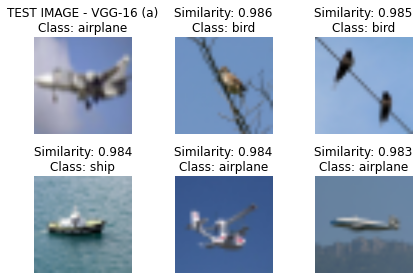

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/airplane/cifar10-test-406.png is added.


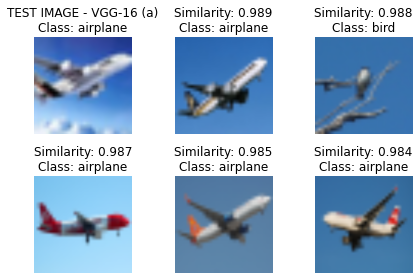

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/airplane/cifar10-test-774.png is added.


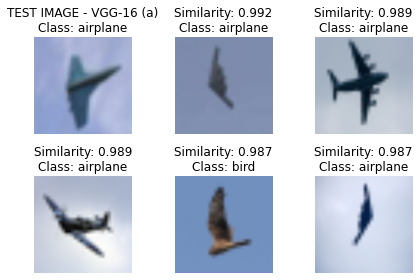

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/automobile/cifar10-test-1182.png is added.


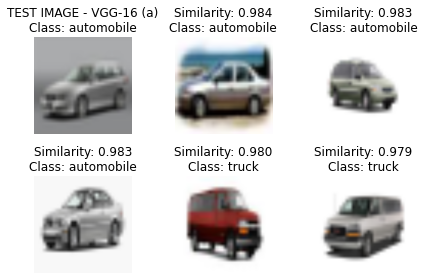

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/automobile/cifar10-test-330.png is added.


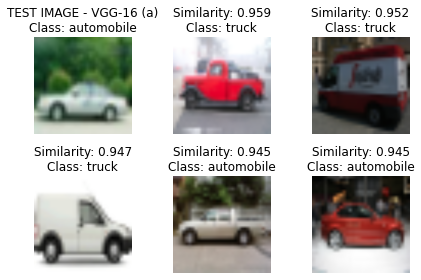

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/automobile/cifar10-test-915.png is added.


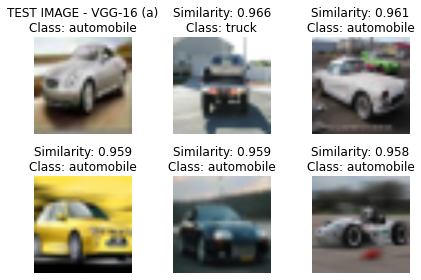

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/bird/cifar10-test-1257.png is added.


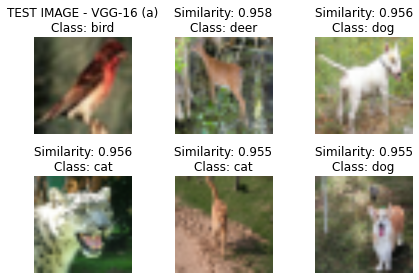

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/bird/cifar10-test-706.png is added.


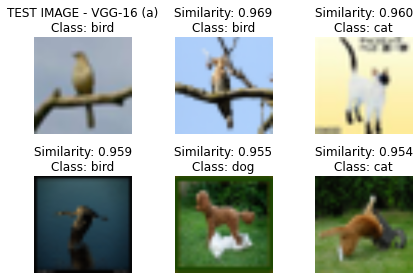

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/bird/cifar10-test-931.png is added.


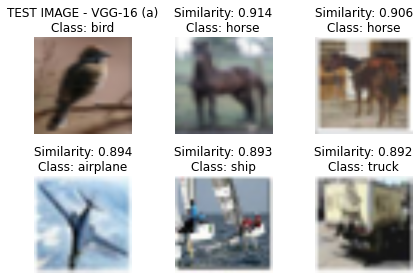

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/cat/cifar10-test-279.png is added.


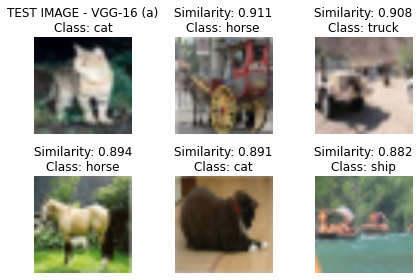

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/cat/cifar10-test-608.png is added.


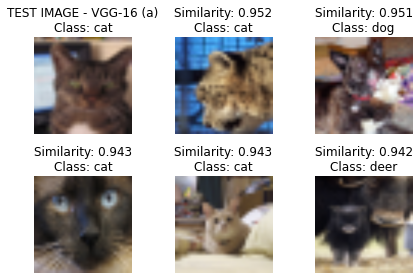

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/cat/cifar10-test-825.png is added.


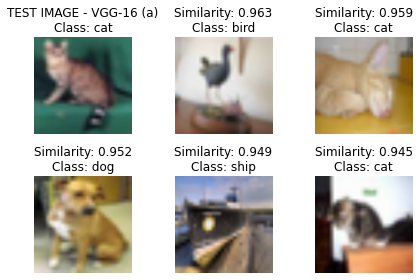

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/deer/cifar10-test-1420.png is added.


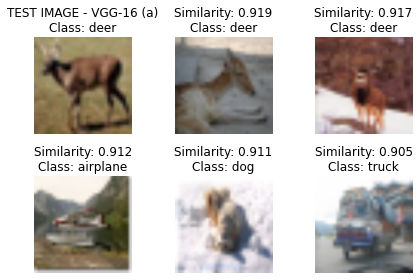

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/deer/cifar10-test-36.png is added.


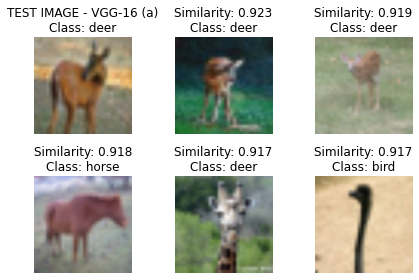

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/deer/cifar10-test-913.png is added.


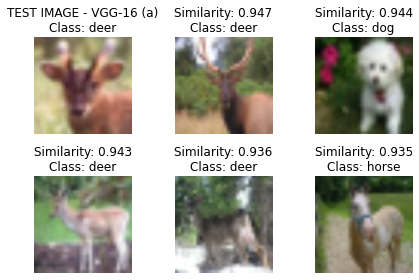

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/dog/cifar10-test-2277.png is added.


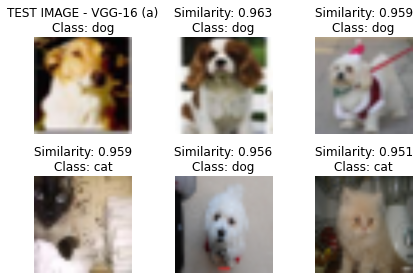

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/dog/cifar10-test-239.png is added.


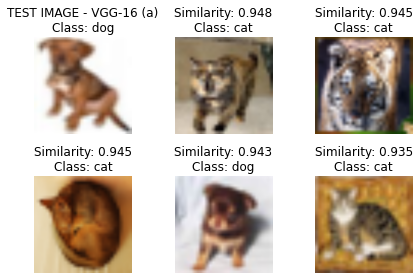

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/dog/cifar10-test-544.png is added.


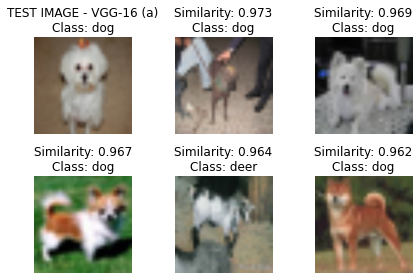

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/frog/cifar10-test-512.png is added.


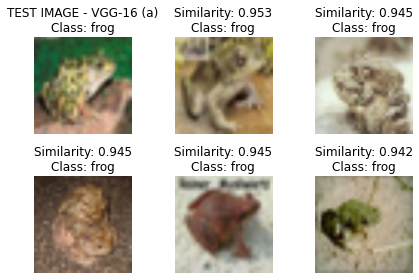

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/frog/cifar10-test-7.png is added.


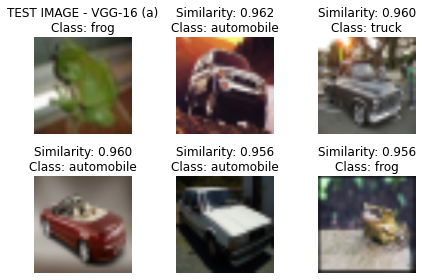

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/frog/cifar10-test-994.png is added.


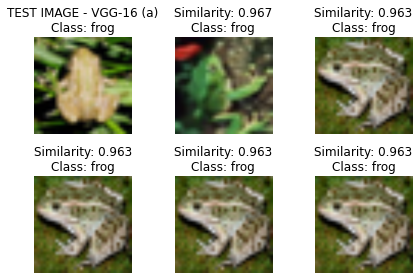

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/horse/cifar10-test-1157.png is added.


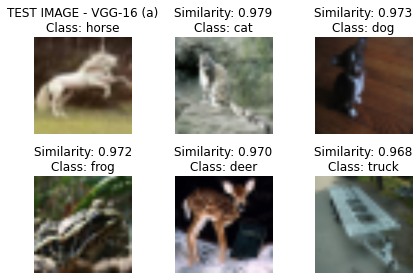

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/horse/cifar10-test-48.png is added.


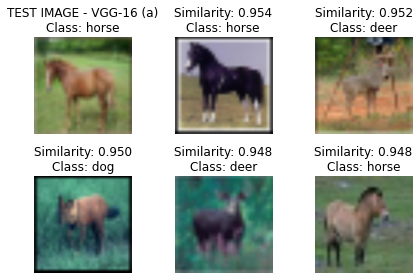

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/horse/cifar10-test-693.png is added.


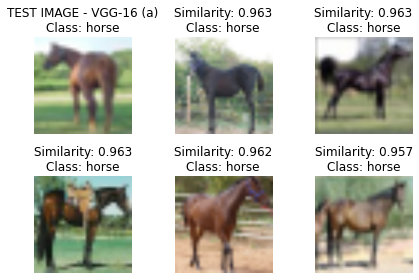

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/ship/cifar10-test-1347.png is added.


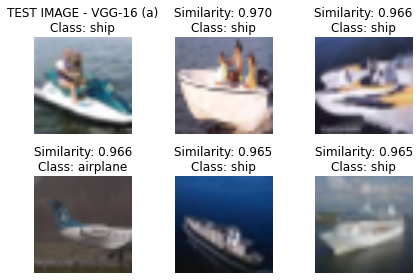

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/ship/cifar10-test-362.png is added.


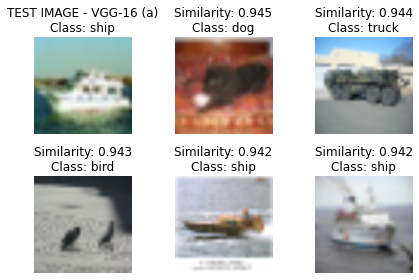

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/ship/cifar10-test-709.png is added.


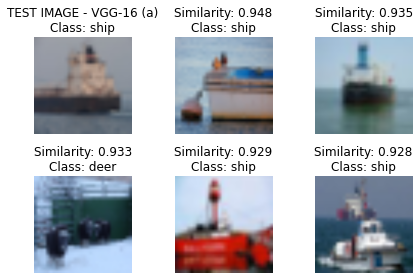

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/truck/cifar10-test-38.png is added.


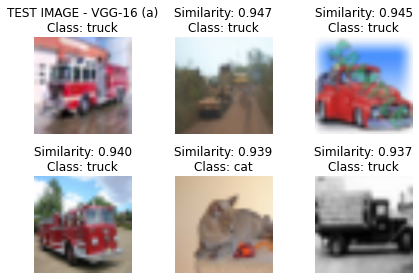

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/truck/cifar10-test-451.png is added.


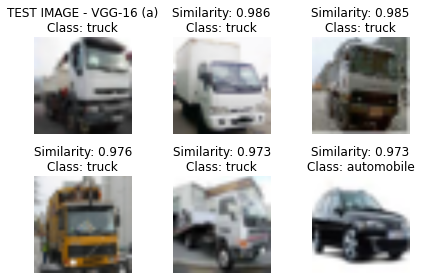

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/truck/cifar10-test-750.png is added.


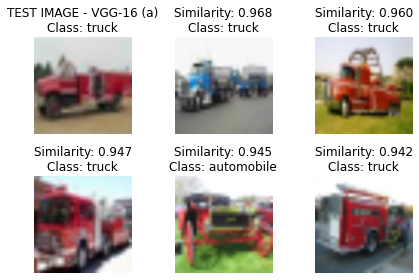

In [ ]:
# Get similar images of test images for VGG-16 (a)
vgg_model_a = getVGG16Model(lastFourTrainable=False)
vgg_model_a.load_weights('/content/drive/MyDrive/Colab Notebooks/cinic-10/model_vgg_nontrainable.h5')
feature_model_vgg_a = Model(inputs=vgg_model_a.input, outputs=vgg_model_a.get_layer('new_fc').output)

df = pd.read_pickle('/content/drive/MyDrive/Colab Notebooks/cinic-10/features_vgg_a.pickle')
for file in feature_test_files:
  getSimilarImages(file, df, feature_model_vgg_a, 'VGG-16 (a)')

Model: "model_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

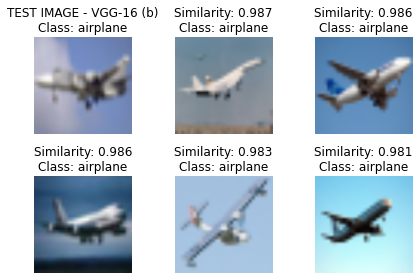

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/airplane/cifar10-test-406.png is added.


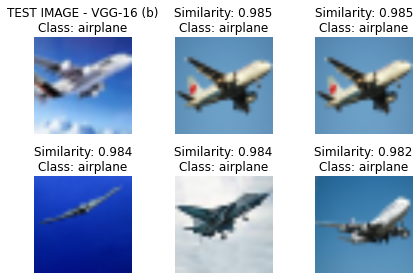

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/airplane/cifar10-test-774.png is added.


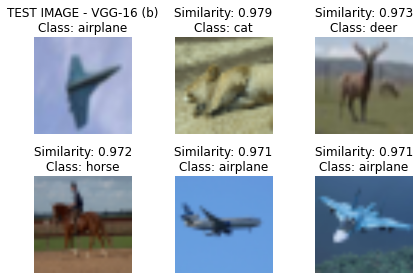

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/automobile/cifar10-test-1182.png is added.


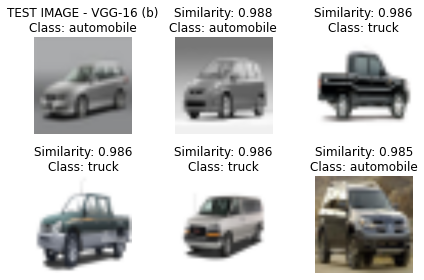

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/automobile/cifar10-test-330.png is added.


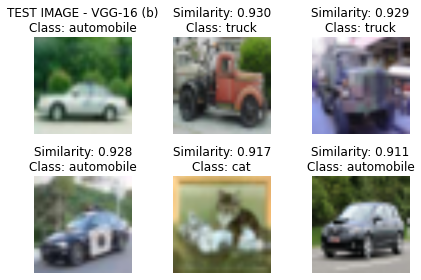

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/automobile/cifar10-test-915.png is added.


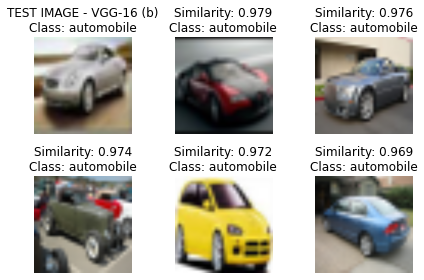

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/bird/cifar10-test-1257.png is added.


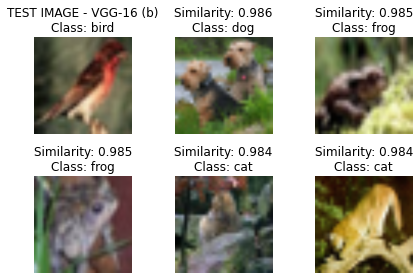

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/bird/cifar10-test-706.png is added.


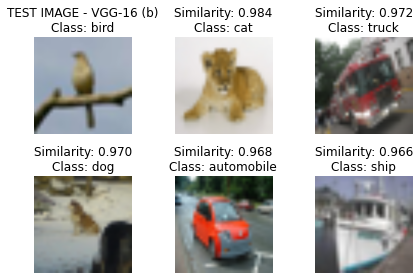

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/bird/cifar10-test-931.png is added.


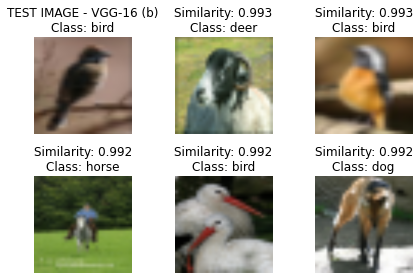

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/cat/cifar10-test-279.png is added.


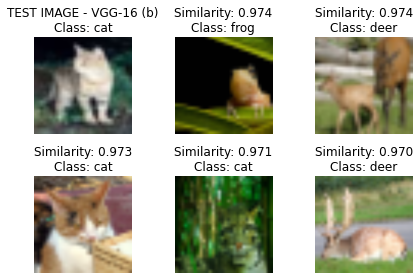

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/cat/cifar10-test-608.png is added.


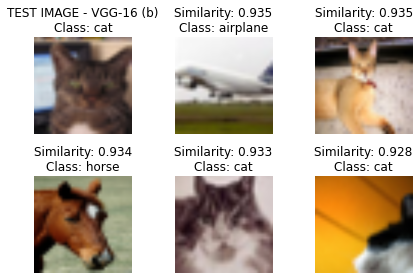

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/cat/cifar10-test-825.png is added.


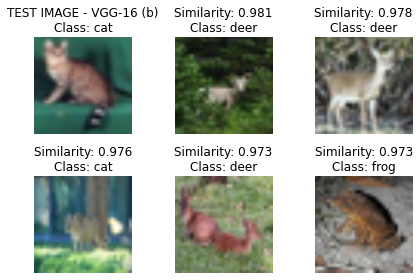

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/deer/cifar10-test-1420.png is added.


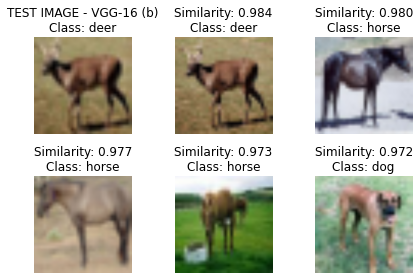

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/deer/cifar10-test-36.png is added.


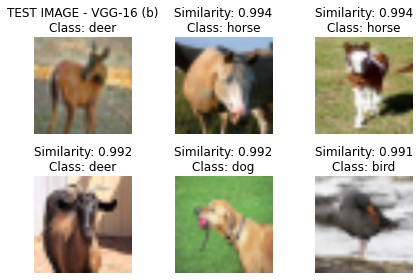

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/deer/cifar10-test-913.png is added.


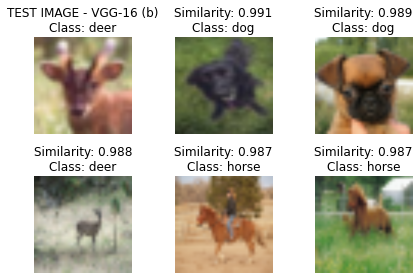

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/dog/cifar10-test-2277.png is added.


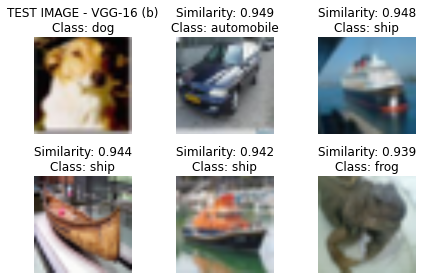

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/dog/cifar10-test-239.png is added.


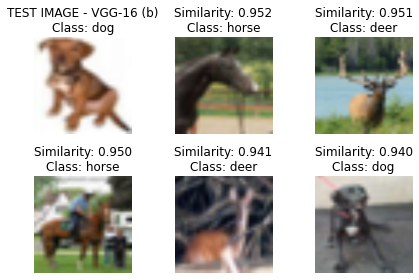

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/dog/cifar10-test-544.png is added.


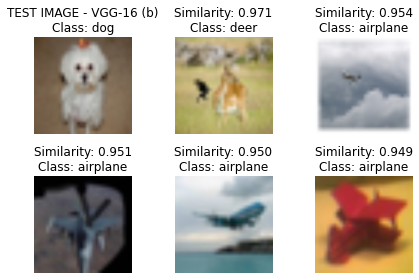

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/frog/cifar10-test-512.png is added.


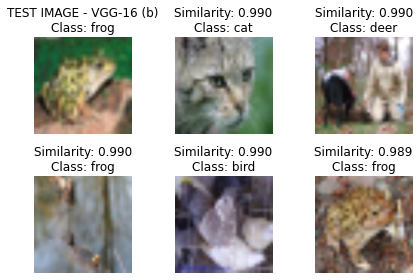

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/frog/cifar10-test-7.png is added.


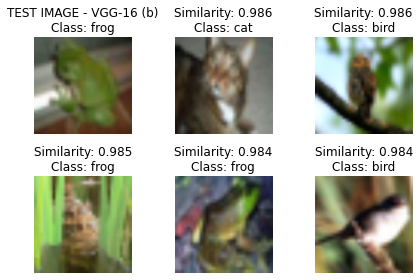

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/frog/cifar10-test-994.png is added.


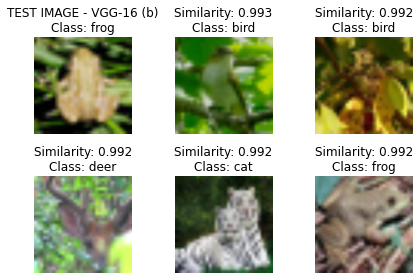

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/horse/cifar10-test-1157.png is added.


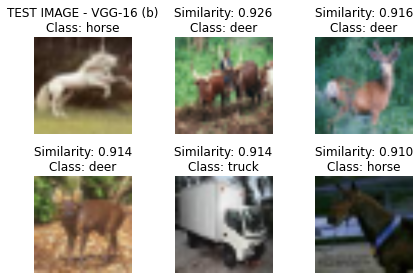

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/horse/cifar10-test-48.png is added.


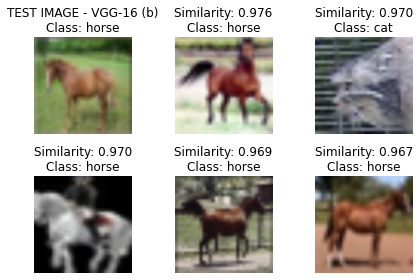

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/horse/cifar10-test-693.png is added.


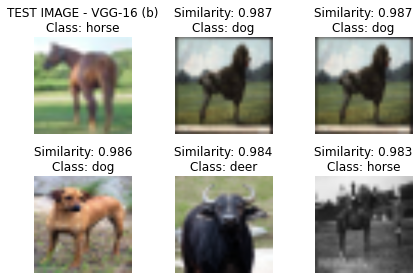

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/ship/cifar10-test-1347.png is added.


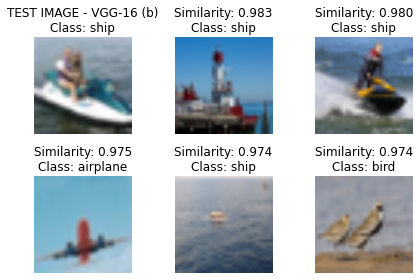

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/ship/cifar10-test-362.png is added.


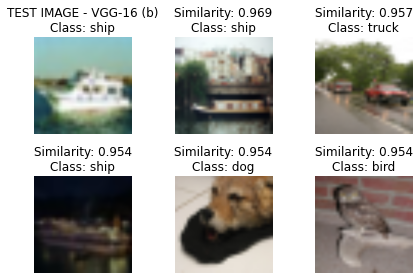

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/ship/cifar10-test-709.png is added.


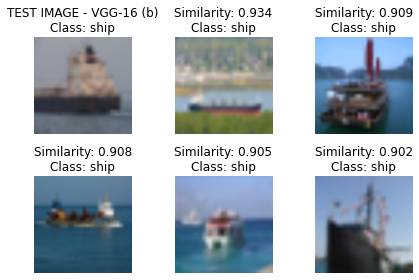

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/truck/cifar10-test-38.png is added.


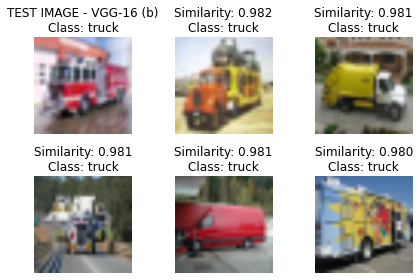

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/truck/cifar10-test-451.png is added.


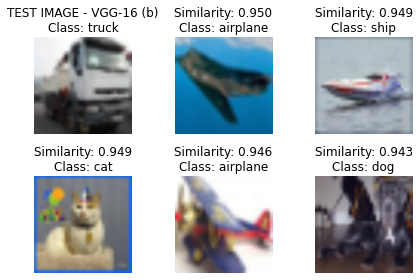

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/truck/cifar10-test-750.png is added.


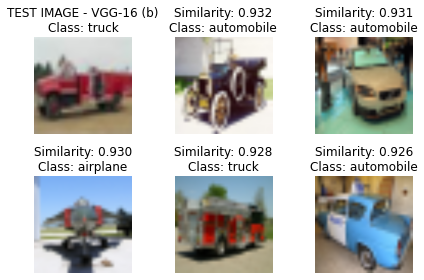

In [24]:
# Get similar images of test images for VGG-16 (b)
vgg_model_b = getVGG16Model(lastFourTrainable=True)
vgg_model_b.load_weights('/content/drive/MyDrive/Colab Notebooks/cinic-10/model_vgg_trainable.h5')
feature_model_vgg_b = Model(inputs=vgg_model_b.input, outputs=vgg_model_b.get_layer('new_fc').output)

df = pd.read_pickle('/content/drive/MyDrive/Colab Notebooks/cinic-10/features_vgg_b.pickle')
for file in feature_test_files:
  getSimilarImages(file, df, feature_model_vgg_b, 'VGG-16 (b)')

102973440/102967424 [==============================] - 1s 0us/step
Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
_________________________

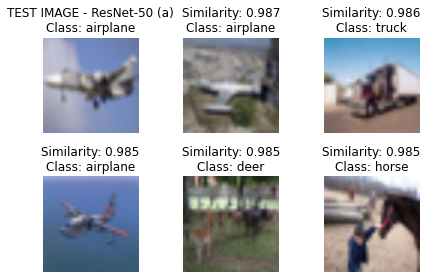

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/airplane/cifar10-test-406.png is added.


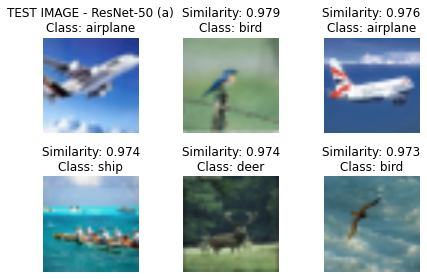

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/airplane/cifar10-test-774.png is added.


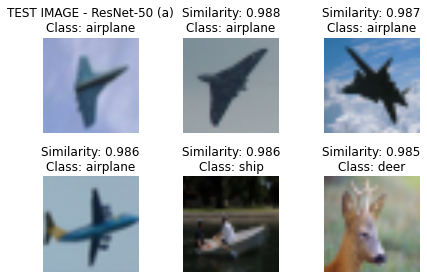

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/automobile/cifar10-test-1182.png is added.


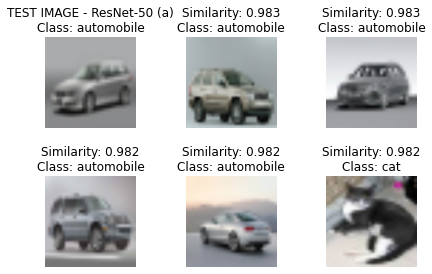

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/automobile/cifar10-test-330.png is added.


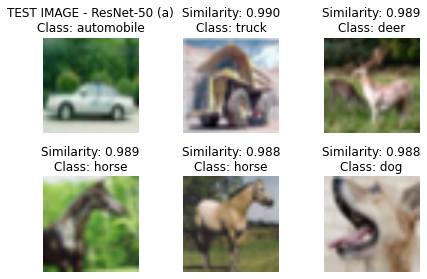

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/automobile/cifar10-test-915.png is added.


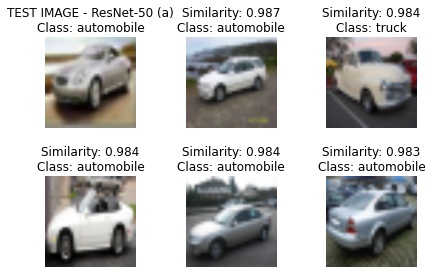

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/bird/cifar10-test-1257.png is added.


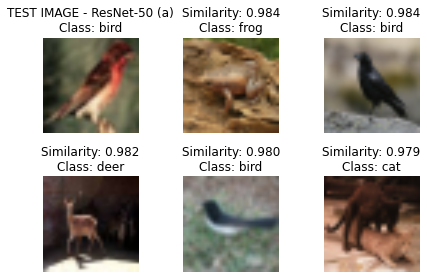

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/bird/cifar10-test-706.png is added.


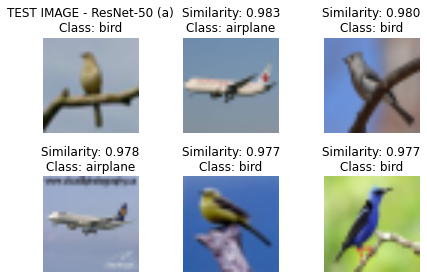

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/bird/cifar10-test-931.png is added.


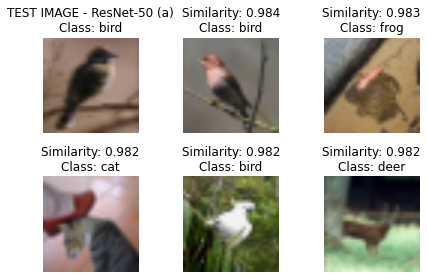

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/cat/cifar10-test-279.png is added.


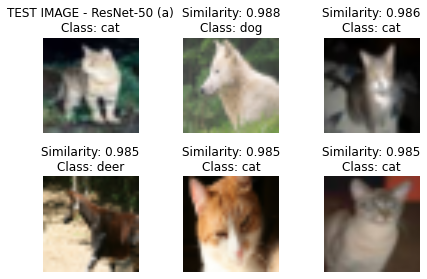

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/cat/cifar10-test-608.png is added.


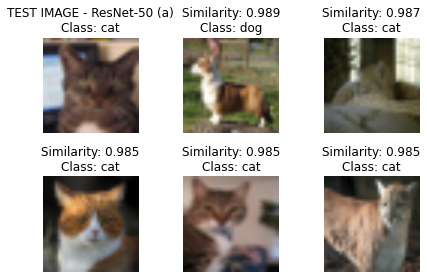

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/cat/cifar10-test-825.png is added.


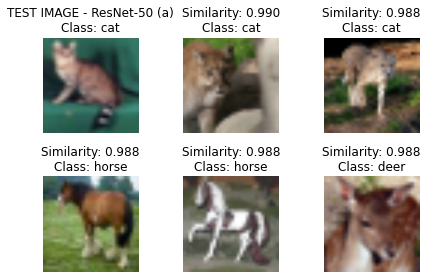

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/deer/cifar10-test-1420.png is added.


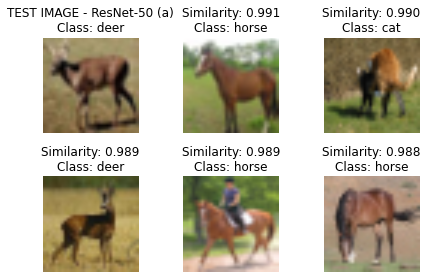

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/deer/cifar10-test-36.png is added.


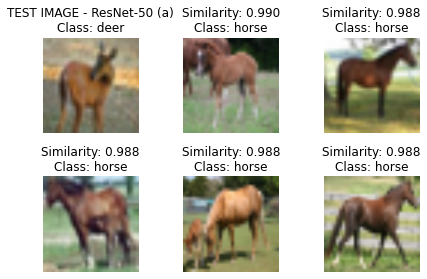

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/deer/cifar10-test-913.png is added.


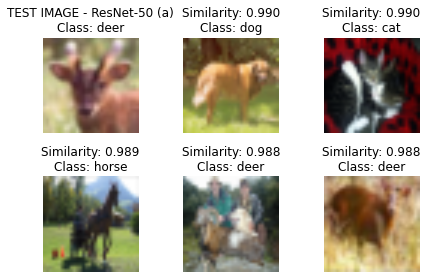

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/dog/cifar10-test-2277.png is added.


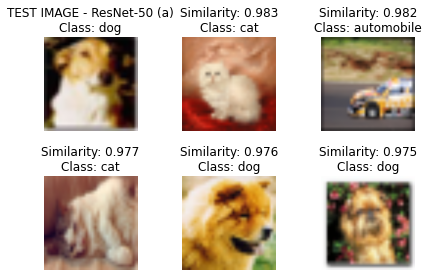

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/dog/cifar10-test-239.png is added.


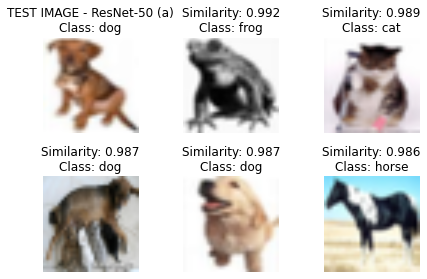

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/dog/cifar10-test-544.png is added.


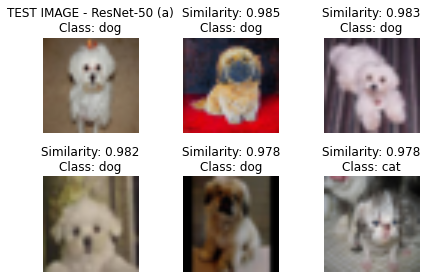

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/frog/cifar10-test-512.png is added.


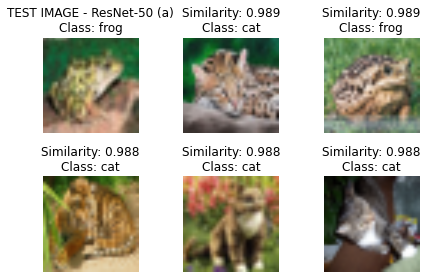

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/frog/cifar10-test-7.png is added.


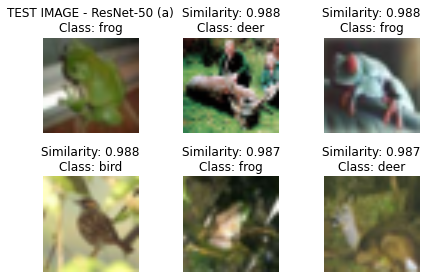

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/frog/cifar10-test-994.png is added.


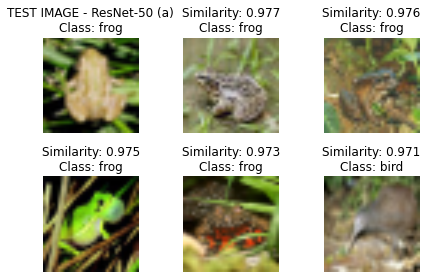

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/horse/cifar10-test-1157.png is added.


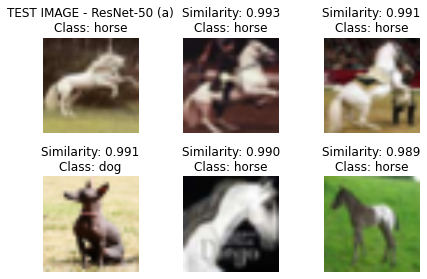

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/horse/cifar10-test-48.png is added.


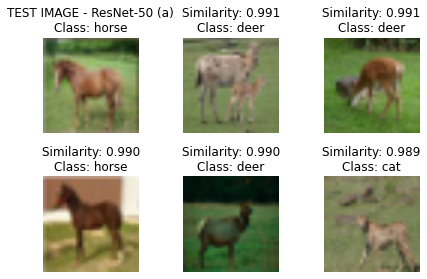

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/horse/cifar10-test-693.png is added.


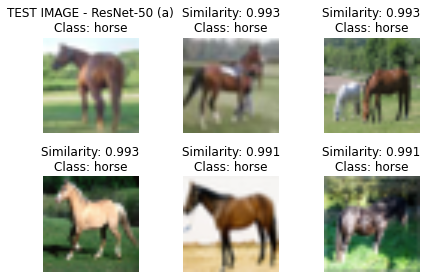

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/ship/cifar10-test-1347.png is added.


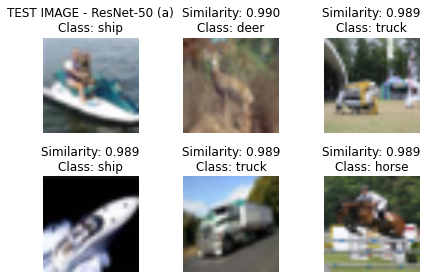

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/ship/cifar10-test-362.png is added.


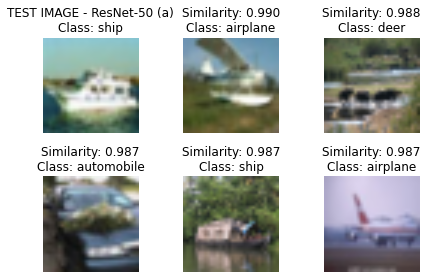

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/ship/cifar10-test-709.png is added.


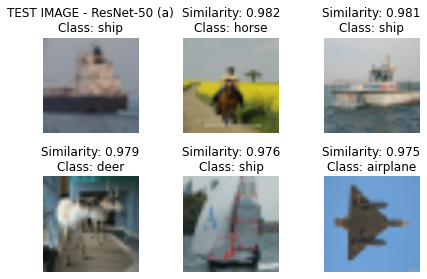

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/truck/cifar10-test-38.png is added.


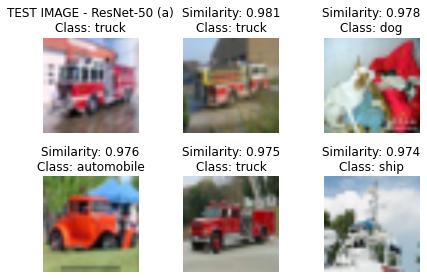

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/truck/cifar10-test-451.png is added.


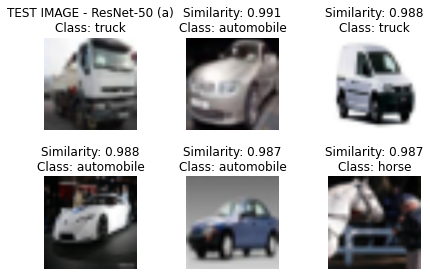

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/truck/cifar10-test-750.png is added.


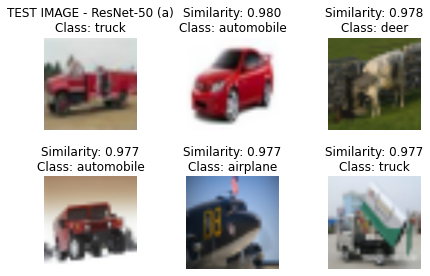

In [ ]:
# Get similar images of test images for ResNet-50 (a)
resnet_model_a = getResNet50Model(lastFourTrainable=False)
resnet_model_a.load_weights('/content/drive/MyDrive/Colab Notebooks/cinic-10/model_resnet_nontrainable.h5')
feature_model_resnet_a = Model(inputs=resnet_model_a.input, outputs=resnet_model_a.get_layer('new_fc').output)

df = pd.read_pickle('/content/drive/MyDrive/Colab Notebooks/cinic-10/features_resnet_a.pickle')
for file in feature_test_files:
  getSimilarImages(file, df, feature_model_resnet_a, 'ResNet-50 (a)')

Model: "model_16"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_10 (InputLayer)           [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_10[0][0]                   
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
___________________________________________________________________________________________

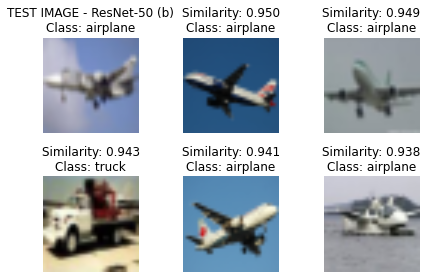

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/airplane/cifar10-test-406.png is added.


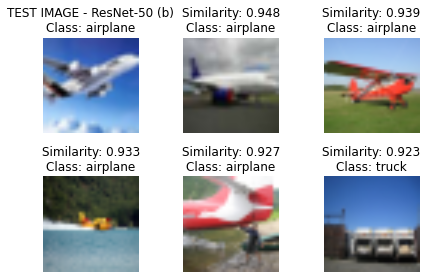

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/airplane/cifar10-test-774.png is added.


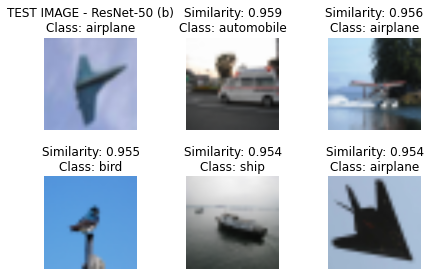

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/automobile/cifar10-test-1182.png is added.


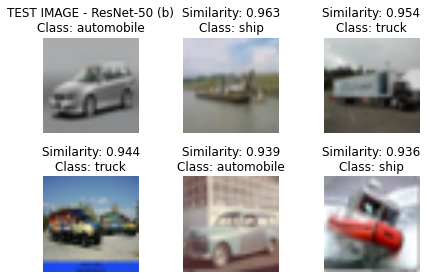

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/automobile/cifar10-test-330.png is added.


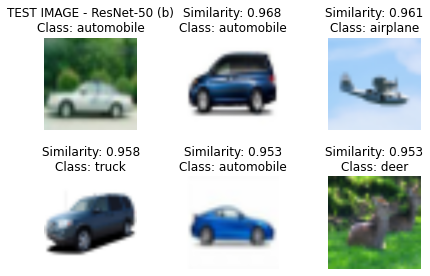

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/automobile/cifar10-test-915.png is added.


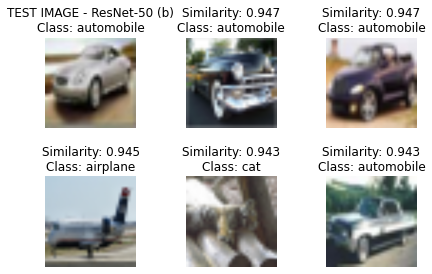

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/bird/cifar10-test-1257.png is added.


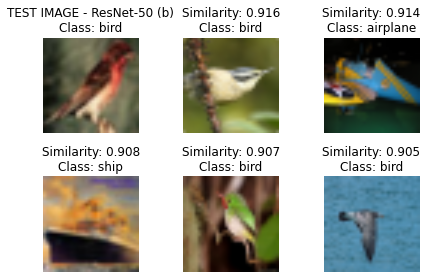

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/bird/cifar10-test-706.png is added.


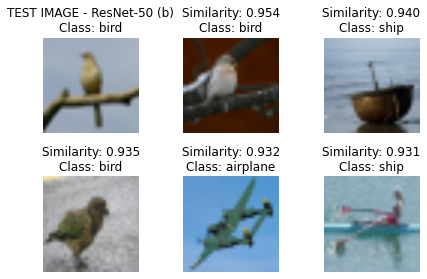

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/bird/cifar10-test-931.png is added.


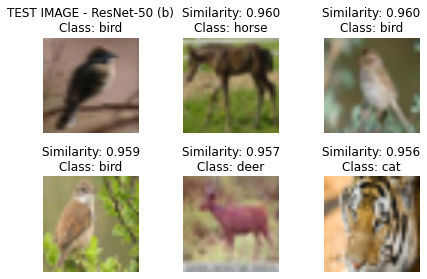

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/cat/cifar10-test-279.png is added.


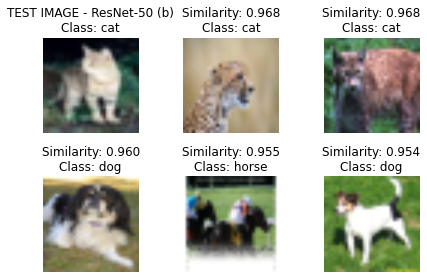

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/cat/cifar10-test-608.png is added.


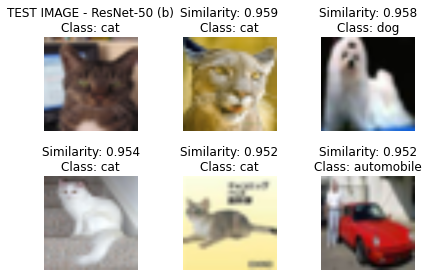

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/cat/cifar10-test-825.png is added.


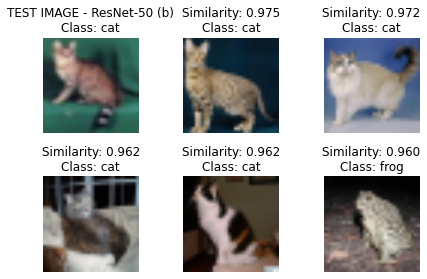

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/deer/cifar10-test-1420.png is added.


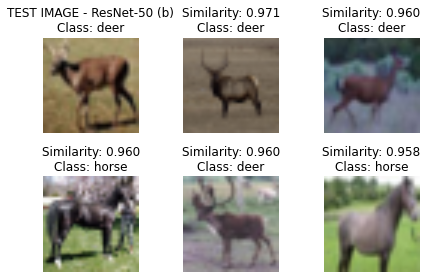

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/deer/cifar10-test-36.png is added.


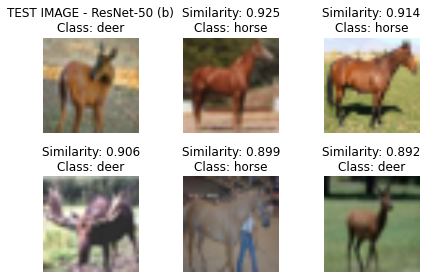

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/deer/cifar10-test-913.png is added.


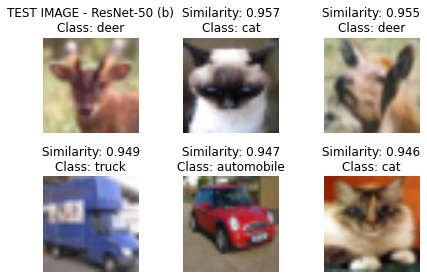

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/dog/cifar10-test-2277.png is added.


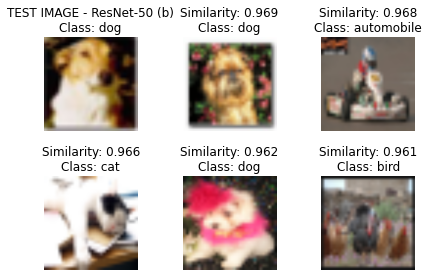

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/dog/cifar10-test-239.png is added.


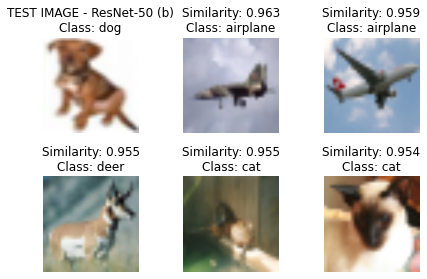

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/dog/cifar10-test-544.png is added.


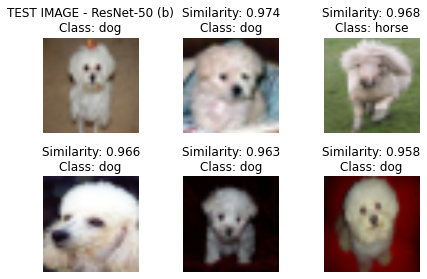

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/frog/cifar10-test-512.png is added.


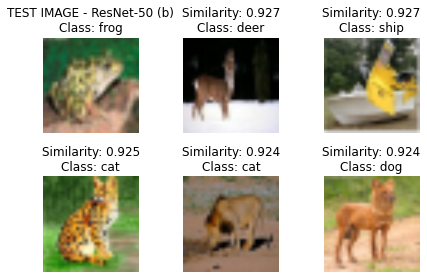

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/frog/cifar10-test-7.png is added.


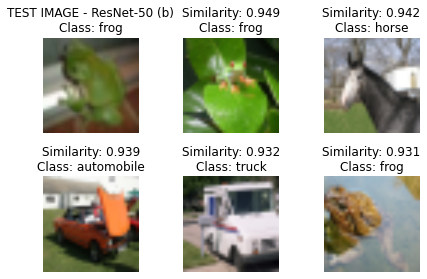

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/frog/cifar10-test-994.png is added.


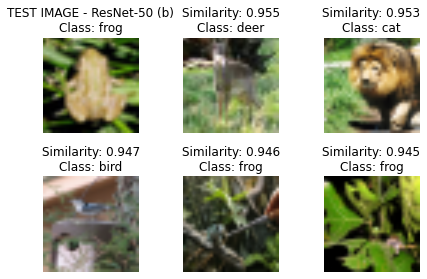

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/horse/cifar10-test-1157.png is added.


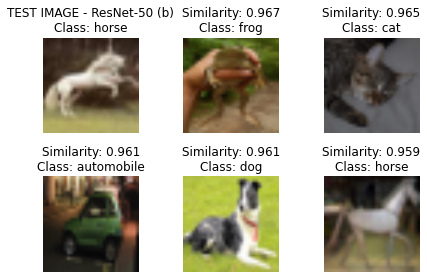

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/horse/cifar10-test-48.png is added.


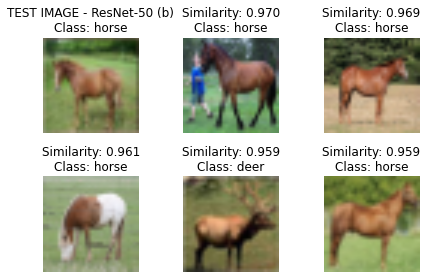

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/horse/cifar10-test-693.png is added.


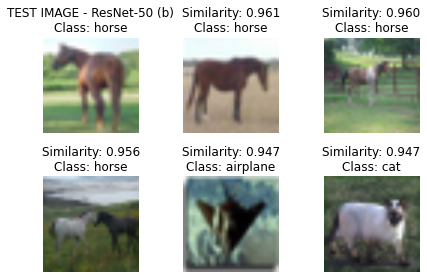

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/ship/cifar10-test-1347.png is added.


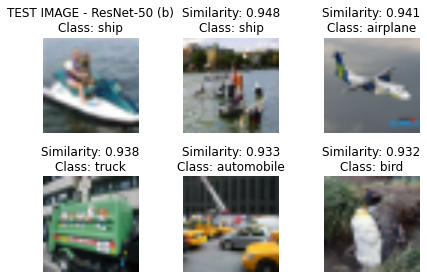

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/ship/cifar10-test-362.png is added.


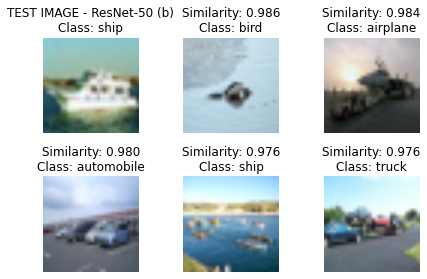

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/ship/cifar10-test-709.png is added.


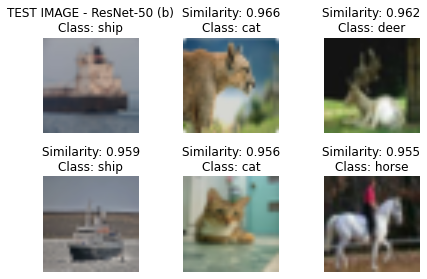

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/truck/cifar10-test-38.png is added.


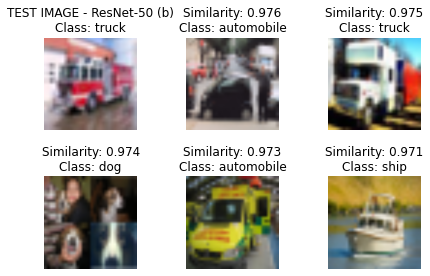

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/truck/cifar10-test-451.png is added.


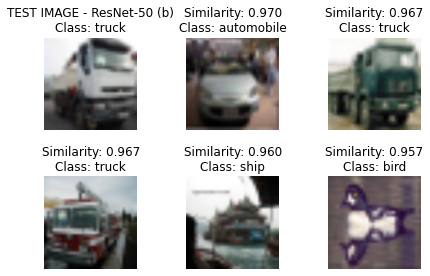

/content/drive/MyDrive/Colab Notebooks/cinic-10/feature_test/truck/cifar10-test-750.png is added.


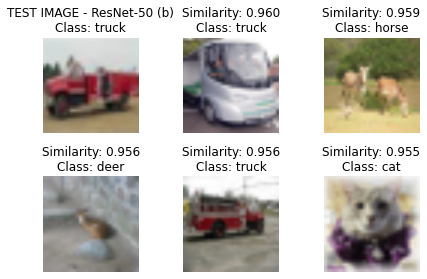

In [ ]:
# Get similar images of test images for ResNet-50 (b)
resnet_model_b = getResNet50Model(lastFourTrainable=True)
resnet_model_b.load_weights('/content/drive/MyDrive/Colab Notebooks/cinic-10/model_resnet_trainable.h5')
feature_model_resnet_b = Model(inputs=resnet_model_b.input, outputs=resnet_model_b.get_layer('new_fc').output)

df = pd.read_pickle('/content/drive/MyDrive/Colab Notebooks/cinic-10/features_resnet_b.pickle')
for file in feature_test_files:
  getSimilarImages(file, df, feature_model_resnet_b, 'ResNet-50 (b)')